In [ ]:
!pip install umap-learn

     |████████████████████████████████| 80 kB 3.7 MB/s 
     |████████████████████████████████| 1.1 MB 36.0 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.1-py3-none-any.whl size=76564 sha256=9c5772f8c49fc86eb5b88f02976673e77aaaa46e1d32741b7023a1eceb05cf1f
  Stored in directory: /root/.cache/pip/wheels/01/e7/bb/347dc0e510803d7116a13d592b10cc68262da56a8eec4dd72f
  Created wheel for pynndescent: filename=pynndescent-0.5.4-py3-none-any.whl size=52373 sha256=9fa515779e1e5d8539bfe2e7ba711c80f4159d5cab2100e1ad43d3589adb1aba
  Stored in directory: /root/.cache/pip/wheels/d0/5b/62/3401692ddad12324249c774c4b15ccb046946021e2b581c043
Successfully built umap-learn pynndescent


In [ ]:
!pip install magic-impute

     |████████████████████████████████| 104 kB 6.8 MB/s 
     |████████████████████████████████| 45 kB 3.2 MB/s 
     |████████████████████████████████| 1.8 MB 52.5 MB/s 


In [ ]:
import pandas as pd
import numpy as np
#import umap #
#import magic
import os
#dGene_Count_per_Cell_NORM.csv
!gdown --id 1kWZ_JVvplc5XT-MipvBYDj1bCktQSMfd
#PHENIX
!gdown --id 1lzEj8hZXbxpP-2aRiUmQ_x7m85flBKqv
#CLUSTERs
!gdown --id 1Cxfpp4Ql7Luq37LnFgVhBEdC64bvu3DX
#SAVER
!gdown --id 1Y0GnSf7Lx9BsDyP7rh1wRvfn2i41_nUW
from sc_PHENIX import run_pca, run_umap, sc_PHENIX


Access denied with the following error:

 	Cannot retrieve the public link of the file. You may need to change
	the permission to 'Anyone with the link', or have had many accesses. 

You may still be able to access the file from the browser:

	 https://drive.google.com/uc?id=1kWZ_JVvplc5XT-MipvBYDj1bCktQSMfd 

Access denied with the following error:

 	Cannot retrieve the public link of the file. You may need to change
	the permission to 'Anyone with the link', or have had many accesses. 

You may still be able to access the file from the browser:

	 https://drive.google.com/uc?id=1lzEj8hZXbxpP-2aRiUmQ_x7m85flBKqv 

Downloading...
From: https://drive.google.com/uc?id=1Cxfpp4Ql7Luq37LnFgVhBEdC64bvu3DX
To: /content/clusters.csv
100% 50.1k/50.1k [00:00<00:00, 26.4MB/s]
Access denied with the following error:

 	Cannot retrieve the public link of the file. You may need to change
	the permission to 'Anyone with the link', or have had many accesses. 

You may still be able to access the file

ModuleNotFoundError: ignored

In [ ]:
import pandas as pd
import numpy as np
import umap #
import magic
pcbm10x = pd.read_csv('/content/Gene_Count_per_Cell_NORM.csv').set_index('Unnamed: 0').T
pcbm10x

clusters =  pd.read_csv('clusters.csv').set_index('cell').astype('category')
clusters


,clus
cell,
AAACATACAACCAC-1,0
AAACATTGAGCTAC-1,3
AAACATTGATCAGC-1,2
AAACCGTGCTTCCG-1,1
AAACCGTGTATGCG-1,6
...,...
TTTCGAACTCTCAT-1,1
TTTCTACTGAGGCA-1,3
TTTCTACTTCCTCG-1,3


# UMAP VISUALIZATION OF THE DATA

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=10, random_state=1)
pca_data= pca.fit_transform(pcbm10x)
fit = umap.UMAP(n_components=2,n_neighbors=30,verbose= True,metric='cosine',min_dist=0.1,random_state=1,transform_seed=32)
%time u_no = fit.fit_transform(pca_data)
u_noimp_umap = pd.DataFrame(u_no, columns=['UMAP1', 'UMAP2'])

UMAP(a=None, angular_rp_forest=True, b=None, dens_frac=0.0, dens_lambda=0.0,
     dens_var_shift=0.1, densmap=False, disconnection_distance=None,
     force_approximation_algorithm=False, init='spectral', learning_rate=1.0,
     local_connectivity=1.0, low_memory=True, metric='cosine', metric_kwds=None,
     min_dist=0.1, n_components=2, n_epochs=None, n_jobs=-1, n_neighbors=30,
     negative_sample_rate=5, output_dens=False, output_metric='euclidean',
     output_metric_kwds=None, random_state=1, repulsion_strength=1.0,
     set_op_mix_ratio=1.0, spread=1.0, target_metric='categorical',
     target_metric_kwds=None, ...)
Construct fuzzy simplicial set


/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


Sun Sep 26 15:30:57 2021 Finding Nearest Neighbors
Sun Sep 26 15:31:01 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3687496 edges.  This is not a problem as no vertices were disconnected.
Sun Sep 26 15:31:04 2021 Construct embedding
	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Sun Sep 26 15:31:14 2021 Finished embedding
CPU times: user 21.5 s, sys: 246 ms, total: 21.8 s
Wall time: 21.3 s


In [ ]:
import plotly.express as px
fig = px.scatter(u_noimp_umap, x="UMAP1", y="UMAP2",color = clusters['clus'])
fig.update_layout({'plot_bgcolor':'rgba(0,0,0,0)'

})
fig.update_traces(marker=dict(size=2))
fig.show()

In [ ]:
import plotly.express as px
fig = px.scatter(u_noimp_umap, x="UMAP1", y="UMAP2",color = clusters['clus'])
fig.update_layout({'plot_bgcolor':'rgba(0,0,0,0)'

})
fig.update_traces(marker=dict(size=2))
fig.show()

Non-imputation

In [ ]:
color_continuous_scale=[(0, "rgb(240, 239, 238)"),(0.0001, "black"),(0.001, "black"),(0.035, "yellow"),(0.5, "#CCFFCC"), (1, "green") ]

import plotly.express as px
fig = px.scatter(u_noimp_umap, x="UMAP1", y="UMAP2",color = pcbm10x['FOXP3'],color_continuous_scale=color_continuous_scale)
fig.update_layout({'plot_bgcolor':'rgba(0,0,0,0)'

})
fig.update_traces(marker=dict(size=6))
fig.show()

IMPUTACION SAVER

In [ ]:
pcbm10x_SAVER = pd.read_csv('pcbm10x_SAVERlisto.csv').set_index('Unnamed: 0').T
pcbm10x_SAVER = pcbm10x_SAVER
pcbm10x_SAVER
import plotly.express as px
fig = px.scatter(u_noimp_umap, x="UMAP1", y="UMAP2",color = pcbm10x_SAVER['FOXP3'])
fig.update_layout({'plot_bgcolor':'rgba(0,0,0,0)'

})
fig.update_traces(marker=dict(size=5))
fig.show()

**Imputation MAGIC**


Replicating Fig 2:

parameters for Fig 2A, B and C


n_pca=30,knn=5,t=5, decay=5,random_state=1

In Fig 2B parameters knn and t change same ones shown in Fig 2B

In [ ]:
# chose values of t=5 and knn=5 and ,knn=30,t=10 for replicating the fig 2 B
# pca=30 dacay=5 and random_state= 1 do not change it  for replicating the fig 2 B
#n_pca=15,knn=5,t=5, decay=5,random_state=1  for replicating the fig 2 A
magic_operator = magic.MAGIC(n_pca=30,knn=5,t=5, decay=5,random_state=1)
imputated_magic =magic_operator.fit_transform(pcbm10x)


Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.37 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.14 seconds.
    Calculating affinities...
    Calculated affinities in 0.18 seconds.
  Calculated graph and diffusion operator in 1.82 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.50 seconds.
Calculated MAGIC in 5.83 seconds.


In [ ]:
import plotly.express as px
fig = px.scatter(u_noimp_umap, x="UMAP1", y="UMAP2",color = imputated_magic['FOXP3'])
fig.update_layout({'plot_bgcolor':'rgba(0,0,0,0)'

})
fig.update_traces(marker=dict(size=5))
fig.show()

**Imputation sc-PHENIX**

Replicating Fig 2:

parameters for Fig 2A, B and C
from sc_PHENIX import run_pca, run_umap, sc_PHENIX

pca_data= run_pca(pcbm10x,n_components=30, random_state=1)

umap_data= run_umap(pca_data,n_components=40,n_neighbors=10,verbose= True,metric='cosine',min_dist=0.3,n_epochs=2000,random_state=1,negative_sample_rate=1

IMPUTATED_DATA_sc_PHENIX = sc_PHENIX(pcbm10x ,umap_data,t=10,knn=35,decay=5,metric='euclidean')

In Fig 2B(ON UMAP) and C parameters knn and t change same ones shown in Fig 2B


In [ ]:
from sc_PHENIX import run_pca, run_umap, sc_PHENIX

pca_data= run_pca(pcbm10x,n_components=30, random_state=1)

umap_data= run_umap(pca_data,n_components=40,n_neighbors=10,verbose= True,metric='cosine',min_dist=0.3,n_epochs=2000,random_state=1,negative_sample_rate=1)


process start Fri Sep 24 00:20:54 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Fri Sep 24 00:20:58 2021 Finding Nearest Neighbors
Fri Sep 24 00:20:58 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3697968 edges.  This is not a problem as no vertices were disconnected.
Fri Sep 24 00:20:58 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Fri Sep 24 00:21:08 2021 Finished embedding


In [ ]:
IMPUTATED_DATA_sc_PHENIX = sc_PHENIX(pcbm10x ,umap_data,t=10,knn=35,decay=5,metric='euclidean')


calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Fri Sep 24 00:21:14 2021


In [ ]:
import plotly.express as px
fig = px.scatter(u_noimp_umap, x="UMAP1", y="UMAP2",color = IMPUTATED_DATA_sc_PHENIX['FOXP3'],color_continuous_scale='YlGn')
fig.update_layout({'plot_bgcolor':'rgba(0,0,0,0)'

})
fig.update_traces(marker=dict(size=5))
fig.show()
#t=10,knn=35,decay=5,metric='euclidean'


NameError: ignored

# sc-PHENIX just UMAP space

In [ ]:
from sc_PHENIX import run_pca, run_umap, sc_PHENIX


umap_data= run_umap(pcbm10x,n_components=40,n_neighbors=10,verbose= True,metric='cosine',min_dist=0.3,n_epochs=2000,random_state=1,negative_sample_rate=1)

UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Thu Sep 23 19:14:02 2021 Finding Nearest Neighbors
Thu Sep 23 19:14:02 2021 Finished Nearest Neighbor Search
Thu Sep 23 19:14:02 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Thu Sep 23 19:14:12 2021 Finished embedding


In [ ]:
IMPUTATED_DATA_sc_PHENIX_ONLY_UMAP = sc_PHENIX(pcbm10x ,umap_data,t=10,knn=35,decay=5,metric='euclidean')


calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Thu Sep 23 19:34:29 2021


**Gene interaction**
CCR7-IL7R
CCR7-PRPRC


Change IL7R to CCR7 to show the other gene-gene interaction

In [ ]:
#MAGIC
# use this in color parameter to see the recovered expression color= IMPUTATED_DATA_sc_PHENIX['FOXP3']
fig = px.scatter(IMPUTATED_DATA_sc_PHENIX, y="CCR7", x="IL7R",color = clusters['clus'])
fig.update_layout({'plot_bgcolor':'rgba(0,0,0,0)'

})
fig.update_traces(marker=dict(size=2))
fig.show()

In [ ]:
#PHENIX
# use this in color parameter to see the recovered expression color= imputated_magic['FOXP3']
fig = px.scatter(imputated_magic, y="CCR7", x="IL7R",color = clusters['clus'])
fig.update_layout({'plot_bgcolor':'rgba(0,0,0,0)'

})
fig.update_traces(marker=dict(size=4))
fig.show()

In [ ]:
#SAVER
# use this in color parameter to see the recovered expression color= pcbm10x_SAVER['FOXP3']
fig = px.scatter(pcbm10x_SAVER, y="CCR7", x="IL7R",color = clusters['clus'])
fig.update_layout({'plot_bgcolor':'rgba(0,0,0,0)'

})
fig.update_traces(marker=dict(size=4))
fig.show()

In [ ]:
#NON-IMPUTED DATA
fig = px.scatter(pcbm10x, y="CCR7", x="IL7R",color = clusters['clus'])
fig.update_layout({'plot_bgcolor':'rgba(0,0,0,0)'

})
fig.update_traces(marker=dict(size=4))

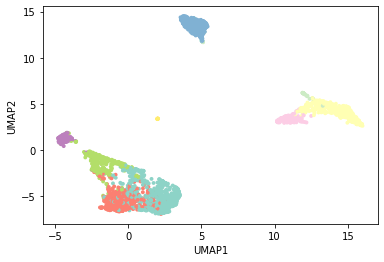

In [ ]:


# Fixing random state for reproducibility


# Fixing random state for reproducibility
a = clusters['clus'].to_numpy()


x = u_noimp_umap['UMAP1']
y = u_noimp_umap['UMAP2']


plt.scatter(x, y, c=a, alpha=1,cmap=cm.Set3,s=15, linewidths=0)
plt.xlabel("UMAP1")
plt.ylabel("UMAP2")
plt.show()

# 1) # MAGIC EVALUATION **knn**
# (cell information shaering) with t = 5

Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/usr/local/lib/python3.7/dist-packages/magic/magic.py:426: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 5.57 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.30 seconds.
    Calculating affinities...
    Calculated affinities in 0.27 seconds.
  Calculated graph and diffusion operator in 6.23 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 9.55 seconds.
Calculated MAGIC in 16.05 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/usr/local/lib/python3.7/dist-packages/magic/magic.py:426: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 5.48 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.29 seconds.
    Calculating affinities...
    Calculated affinities in 0.26 seconds.
  Calculated graph and diffusion operator in 6.12 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 9.31 seconds.
Calculated MAGIC in 15.69 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/usr/local/lib/python3.7/dist-packages/magic/magic.py:426: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 5.41 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.33 seconds.
    Calculating affinities...
    Calculated affinities in 0.30 seconds.
  Calculated graph and diffusion operator in 6.11 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 9.35 seconds.
Calculated MAGIC in 15.74 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/usr/local/lib/python3.7/dist-packages/magic/magic.py:426: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 5.30 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.31 seconds.
    Calculating affinities...
    Calculated affinities in 0.30 seconds.
  Calculated graph and diffusion operator in 6.00 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 9.44 seconds.
Calculated MAGIC in 15.71 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/usr/local/lib/python3.7/dist-packages/magic/magic.py:426: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 5.21 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.30 seconds.
    Calculating affinities...
    Calculated affinities in 0.29 seconds.
  Calculated graph and diffusion operator in 5.89 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 9.45 seconds.
Calculated MAGIC in 15.61 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/usr/local/lib/python3.7/dist-packages/magic/magic.py:426: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 5.06 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.31 seconds.
    Calculating affinities...
    Calculated affinities in 0.29 seconds.
  Calculated graph and diffusion operator in 5.73 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 9.40 seconds.
Calculated MAGIC in 15.41 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/usr/local/lib/python3.7/dist-packages/magic/magic.py:426: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 5.09 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.32 seconds.
    Calculating affinities...
    Calculated affinities in 0.29 seconds.
  Calculated graph and diffusion operator in 5.79 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 9.51 seconds.
Calculated MAGIC in 15.58 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/usr/local/lib/python3.7/dist-packages/magic/magic.py:426: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 5.41 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.36 seconds.
    Calculating affinities...
    Calculated affinities in 0.32 seconds.
  Calculated graph and diffusion operator in 6.18 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 9.49 seconds.
Calculated MAGIC in 15.97 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/usr/local/lib/python3.7/dist-packages/magic/magic.py:426: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 5.17 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.33 seconds.
    Calculating affinities...
    Calculated affinities in 0.30 seconds.
  Calculated graph and diffusion operator in 5.90 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 9.32 seconds.
Calculated MAGIC in 15.51 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/usr/local/lib/python3.7/dist-packages/magic/magic.py:426: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 5.05 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.34 seconds.
    Calculating affinities...
    Calculated affinities in 0.34 seconds.
  Calculated graph and diffusion operator in 5.82 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 9.39 seconds.
Calculated MAGIC in 15.49 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/usr/local/lib/python3.7/dist-packages/magic/magic.py:426: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 5.03 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.34 seconds.
    Calculating affinities...
    Calculated affinities in 0.37 seconds.
  Calculated graph and diffusion operator in 5.83 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 9.25 seconds.
Calculated MAGIC in 15.35 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/usr/local/lib/python3.7/dist-packages/magic/magic.py:426: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 5.06 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.39 seconds.
    Calculating affinities...
    Calculated affinities in 0.43 seconds.
  Calculated graph and diffusion operator in 5.97 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 9.21 seconds.
Calculated MAGIC in 15.45 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/usr/local/lib/python3.7/dist-packages/magic/magic.py:426: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 4.98 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.41 seconds.
    Calculating affinities...
    Calculated affinities in 0.47 seconds.
  Calculated graph and diffusion operator in 5.98 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 9.37 seconds.
Calculated MAGIC in 15.62 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/usr/local/lib/python3.7/dist-packages/magic/magic.py:426: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 5.06 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.45 seconds.
    Calculating affinities...
    Calculated affinities in 0.48 seconds.
  Calculated graph and diffusion operator in 6.09 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 9.32 seconds.
Calculated MAGIC in 15.68 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/usr/local/lib/python3.7/dist-packages/magic/magic.py:426: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 5.00 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.45 seconds.
    Calculating affinities...
    Calculated affinities in 0.47 seconds.
  Calculated graph and diffusion operator in 6.02 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 9.33 seconds.
Calculated MAGIC in 15.63 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/usr/local/lib/python3.7/dist-packages/magic/magic.py:426: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 5.12 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.47 seconds.
    Calculating affinities...
    Calculated affinities in 0.54 seconds.
  Calculated graph and diffusion operator in 6.25 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 9.33 seconds.
Calculated MAGIC in 15.87 seconds.


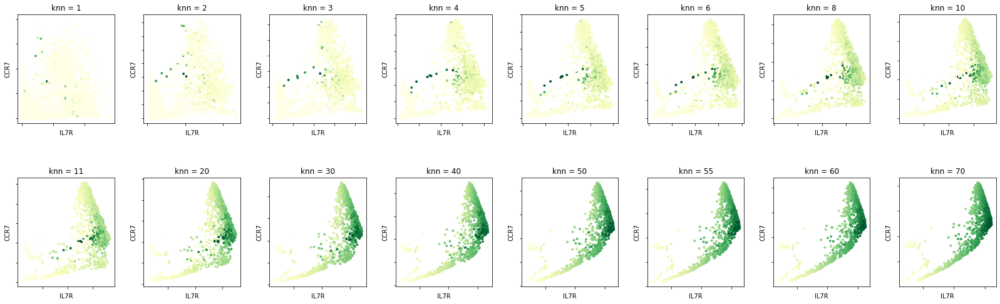

In [ ]:
# MAGIC EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

knn_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(knn_vec)):
    knn_curr = knn_vec[i]


    magic_operator = magic.MAGIC(t = 5, n_pca = 30, knn = knn_curr,decay= 5, random_state=1)
    imputated_magic =magic_operator.fit_transform(pcbm10x)


    x = imputated_magic["IL7R"]
    y = imputated_magic["CCR7"]
    c = imputated_magic["FOXP3"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('knn = ' + str(knn_curr))

plt.show()


Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.75 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.12 seconds.
  Calculated graph and diffusion operator in 2.09 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.85 seconds.
Calculated MAGIC in 6.61 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.42 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.11 seconds.
    Calculating affinities...
    Calculated affinities in 0.15 seconds.
  Calculated graph and diffusion operator in 1.78 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.97 seconds.
Calculated MAGIC in 6.07 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.34 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.11 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.67 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.92 seconds.
Calculated MAGIC in 5.75 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.26 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.61 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.69 seconds.
Calculated MAGIC in 5.50 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.36 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.71 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.69 seconds.
Calculated MAGIC in 5.64 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.28 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.61 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.77 seconds.
Calculated MAGIC in 5.58 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.23 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.15 seconds.
  Calculated graph and diffusion operator in 1.58 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.61 seconds.
Calculated MAGIC in 5.37 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.21 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.55 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.66 seconds.
Calculated MAGIC in 5.40 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.26 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.61 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.71 seconds.
Calculated MAGIC in 5.49 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.25 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.14 seconds.
    Calculating affinities...
    Calculated affinities in 0.18 seconds.
  Calculated graph and diffusion operator in 1.65 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.81 seconds.
Calculated MAGIC in 5.64 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.22 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.16 seconds.
    Calculating affinities...
    Calculated affinities in 0.19 seconds.
  Calculated graph and diffusion operator in 1.66 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.81 seconds.
Calculated MAGIC in 5.64 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.19 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.18 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 1.67 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.90 seconds.
Calculated MAGIC in 5.77 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.25 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.19 seconds.
    Calculating affinities...
    Calculated affinities in 0.26 seconds.
  Calculated graph and diffusion operator in 1.85 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.82 seconds.
Calculated MAGIC in 5.86 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.34 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.20 seconds.
    Calculating affinities...
    Calculated affinities in 0.27 seconds.
  Calculated graph and diffusion operator in 1.92 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.42 seconds.
Calculated MAGIC in 6.52 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.35 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.22 seconds.
    Calculating affinities...
    Calculated affinities in 0.26 seconds.
  Calculated graph and diffusion operator in 1.92 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.14 seconds.
Calculated MAGIC in 6.22 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.54 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.31 seconds.
    Calculating affinities...
    Calculated affinities in 0.45 seconds.
  Calculated graph and diffusion operator in 3.44 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.79 seconds.
Calculated MAGIC in 8.50 seconds.


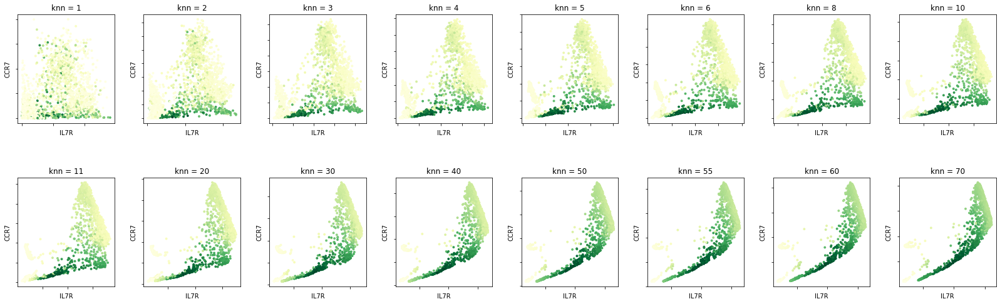

In [ ]:
# MAGIC EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

knn_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(knn_vec)):
    knn_curr = knn_vec[i]


    magic_operator = magic.MAGIC(t = 5, n_pca = 30, knn = knn_curr,decay= 5, random_state=1)
    imputated_magic =magic_operator.fit_transform(pcbm10x)


    x = imputated_magic["IL7R"]
    y = imputated_magic["CCR7"]
    c = imputated_magic["CD8A"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('knn = ' + str(knn_curr))

plt.show()


Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.08 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.11 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 2.44 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.13 seconds.
Calculated MAGIC in 6.92 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.17 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.11 seconds.
    Calculating affinities...
    Calculated affinities in 0.12 seconds.
  Calculated graph and diffusion operator in 1.48 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.12 seconds.
Calculated MAGIC in 5.81 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.51 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.91 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.01 seconds.
Calculated MAGIC in 6.25 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.28 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.60 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.01 seconds.
Calculated MAGIC in 5.84 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.18 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.51 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.17 seconds.
Calculated MAGIC in 5.87 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.66 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 2.01 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.38 seconds.
Calculated MAGIC in 6.58 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.43 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.79 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.38 seconds.
Calculated MAGIC in 6.36 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.27 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.16 seconds.
  Calculated graph and diffusion operator in 1.64 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.31 seconds.
Calculated MAGIC in 6.14 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.39 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.16 seconds.
  Calculated graph and diffusion operator in 1.78 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.33 seconds.
Calculated MAGIC in 6.31 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.40 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.15 seconds.
    Calculating affinities...
    Calculated affinities in 0.17 seconds.
  Calculated graph and diffusion operator in 1.80 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.46 seconds.
Calculated MAGIC in 7.49 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.01 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.17 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 2.51 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.52 seconds.
Calculated MAGIC in 7.54 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.46 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.19 seconds.
    Calculating affinities...
    Calculated affinities in 0.24 seconds.
  Calculated graph and diffusion operator in 2.00 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.54 seconds.
Calculated MAGIC in 8.03 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 3.86 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.22 seconds.
    Calculating affinities...
    Calculated affinities in 0.60 seconds.
  Calculated graph and diffusion operator in 4.81 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.15 seconds.
Calculated MAGIC in 10.40 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.77 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.21 seconds.
    Calculating affinities...
    Calculated affinities in 0.27 seconds.
  Calculated graph and diffusion operator in 2.37 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.94 seconds.
Calculated MAGIC in 7.69 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.39 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.22 seconds.
    Calculating affinities...
    Calculated affinities in 0.29 seconds.
  Calculated graph and diffusion operator in 2.03 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.62 seconds.
Calculated MAGIC in 8.01 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.50 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.24 seconds.
    Calculating affinities...
    Calculated affinities in 0.34 seconds.
  Calculated graph and diffusion operator in 2.20 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.44 seconds.
Calculated MAGIC in 6.96 seconds.


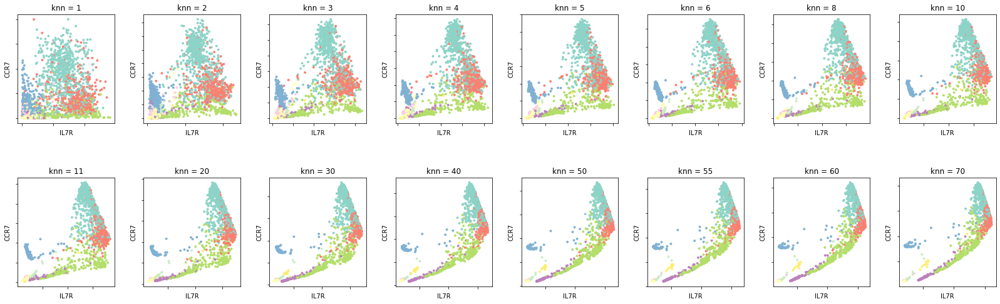

In [ ]:
# MAGIC EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()
a = clusters['clus'].to_numpy()
a.shape
import magic

knn_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(knn_vec)):
    knn_curr = knn_vec[i]


    magic_operator = magic.MAGIC(t = 5, n_pca = 30, knn = knn_curr,decay= 5, random_state=1)
    imputated_magic =magic_operator.fit_transform(pcbm10x)


    x = imputated_magic["IL7R"]
    y = imputated_magic["CCR7"]
    c = imputated_magic["CD8A"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=a, cmap=cm.Set3)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('knn = ' + str(knn_curr))
   #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()


# 1) # PHENIX EVALUATION **knn**
# (cell information shaering) with t = 5

process start Fri Sep 24 01:19:14 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Fri Sep 24 01:19:18 2021 Finding Nearest Neighbors
Fri Sep 24 01:19:18 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3697968 edges.  This is not a problem as no vertices were disconnected.
Fri Sep 24 01:19:18 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Fri Sep 24 01:19:26 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity

	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Fri Sep 24 01:21:55 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Fri Sep 24 01:22:03 2021
process start Fri Sep 24 01:22:04 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Fri Sep 24 01:22:09 2021 Finding Nearest Neighbors
Fri Sep 24 01:22:09 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3697968 edges.  This is not a problem as no vertices were disconnected.
Fri Sep 24 01:22:09 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	comple

	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Fri Sep 24 01:24:23 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Fri Sep 24 01:24:29 2021


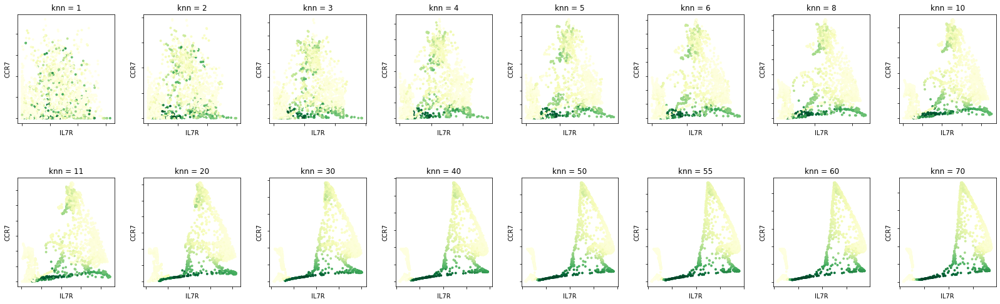

In [ ]:
# phenix  EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

knn_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(knn_vec)):
    knn_curr = knn_vec[i]


    pca_data= run_pca(pcbm10x,n_components=30, random_state=1)

    umap_data= run_umap(pca_data,n_components=40,n_neighbors=10,verbose= True,metric='cosine',min_dist=0.3,n_epochs=2000,random_state=1,negative_sample_rate=1)

    IMPUTATED_DATA_sc_PHENIX = sc_PHENIX(pcbm10x ,umap_data,t=5,knn=knn_curr,decay=5)
    df_new_curr = IMPUTATED_DATA_sc_PHENIX


    x = IMPUTATED_DATA_sc_PHENIX["IL7R"]
    y = IMPUTATED_DATA_sc_PHENIX["CCR7"]
    c = IMPUTATED_DATA_sc_PHENIX["CD8A"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('knn = ' + str(knn_curr))
    #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()

process start Fri Sep 24 01:24:30 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Fri Sep 24 01:24:34 2021 Finding Nearest Neighbors
Fri Sep 24 01:24:34 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3697968 edges.  This is not a problem as no vertices were disconnected.
Fri Sep 24 01:24:34 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Fri Sep 24 01:24:41 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity

	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Fri Sep 24 01:26:41 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Fri Sep 24 01:26:47 2021
process start Fri Sep 24 01:26:47 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Fri Sep 24 01:26:51 2021 Finding Nearest Neighbors
Fri Sep 24 01:26:51 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3697968 edges.  This is not a problem as no vertices were disconnected.
Fri Sep 24 01:26:51 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	comple

	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Fri Sep 24 01:28:56 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Fri Sep 24 01:29:01 2021


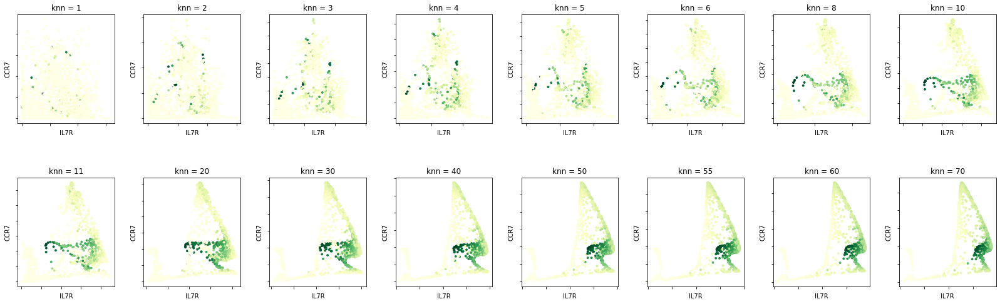

In [ ]:
# phenix  EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

knn_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(knn_vec)):
    knn_curr = knn_vec[i]


    pca_data= run_pca(pcbm10x,n_components=30, random_state=1)

    umap_data= run_umap(pca_data,n_components=40,n_neighbors=10,verbose= True,metric='cosine',min_dist=0.3,n_epochs=2000,random_state=1,negative_sample_rate=1)

    IMPUTATED_DATA_sc_PHENIX = sc_PHENIX(pcbm10x ,umap_data,t=5,knn=knn_curr,decay=5)
    df_new_curr = IMPUTATED_DATA_sc_PHENIX


    x = IMPUTATED_DATA_sc_PHENIX["IL7R"]
    y = IMPUTATED_DATA_sc_PHENIX["CCR7"]
    c = IMPUTATED_DATA_sc_PHENIX["FOXP3"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('knn = ' + str(knn_curr))
    #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()

process start Fri Sep 24 01:29:02 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Fri Sep 24 01:29:06 2021 Finding Nearest Neighbors
Fri Sep 24 01:29:06 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3697968 edges.  This is not a problem as no vertices were disconnected.
Fri Sep 24 01:29:06 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Fri Sep 24 01:29:14 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity

	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Fri Sep 24 01:31:11 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Fri Sep 24 01:31:17 2021
process start Fri Sep 24 01:31:17 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Fri Sep 24 01:31:21 2021 Finding Nearest Neighbors
Fri Sep 24 01:31:21 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3697968 edges.  This is not a problem as no vertices were disconnected.
Fri Sep 24 01:31:21 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	comple

	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Fri Sep 24 01:33:25 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Fri Sep 24 01:33:31 2021


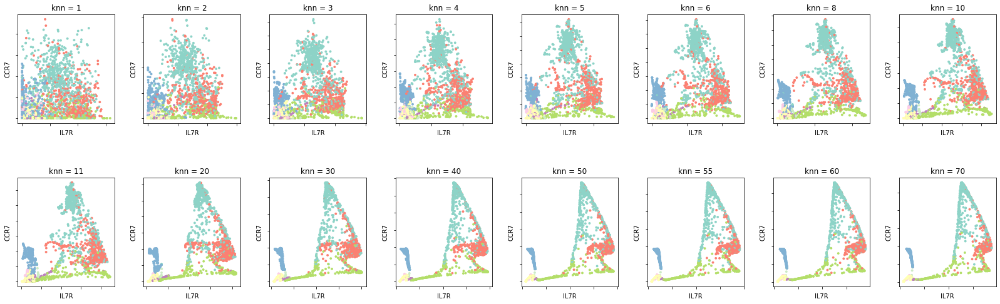

In [ ]:
# phenix  EVALUATION KNN
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()
a = clusters['clus'].to_numpy()
import magic

knn_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(knn_vec)):
    knn_curr = knn_vec[i]


    pca_data= run_pca(pcbm10x,n_components=30, random_state=1)

    umap_data= run_umap(pca_data,n_components=40,n_neighbors=10,verbose= True,metric='cosine',min_dist=0.3,n_epochs=2000,random_state=1,negative_sample_rate=1)

    IMPUTATED_DATA_sc_PHENIX = sc_PHENIX(pcbm10x ,umap_data,t=5,knn=knn_curr,decay=5)
    df_new_curr = IMPUTATED_DATA_sc_PHENIX


    x = IMPUTATED_DATA_sc_PHENIX["IL7R"]
    y = IMPUTATED_DATA_sc_PHENIX["CCR7"]
    c = IMPUTATED_DATA_sc_PHENIX["FOXP3"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=a, cmap=cm.Set3)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('knn = ' + str(knn_curr))
    #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()

# MAGIC EVALUATION knn(cell information shaering) with t = 10

Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.51 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.17 seconds.
  Calculated graph and diffusion operator in 1.91 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.02 seconds.
Calculated MAGIC in 6.68 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.35 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.70 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.88 seconds.
Calculated MAGIC in 5.77 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.19 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.52 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.69 seconds.
Calculated MAGIC in 5.46 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.09 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.41 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.85 seconds.
Calculated MAGIC in 5.45 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.20 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.55 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.81 seconds.
Calculated MAGIC in 5.57 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.12 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.44 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.77 seconds.
Calculated MAGIC in 5.40 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.06 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.40 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.03 seconds.
Calculated MAGIC in 5.60 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.21 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.16 seconds.
  Calculated graph and diffusion operator in 1.59 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.93 seconds.
Calculated MAGIC in 5.71 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.12 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.48 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.01 seconds.
Calculated MAGIC in 5.68 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.30 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.15 seconds.
    Calculating affinities...
    Calculated affinities in 0.16 seconds.
  Calculated graph and diffusion operator in 1.69 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.15 seconds.
Calculated MAGIC in 6.02 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.21 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.17 seconds.
    Calculating affinities...
    Calculated affinities in 0.19 seconds.
  Calculated graph and diffusion operator in 1.66 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.10 seconds.
Calculated MAGIC in 5.97 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.19 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.19 seconds.
    Calculating affinities...
    Calculated affinities in 0.23 seconds.
  Calculated graph and diffusion operator in 1.69 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.09 seconds.
Calculated MAGIC in 5.97 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.30 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.19 seconds.
    Calculating affinities...
    Calculated affinities in 0.30 seconds.
  Calculated graph and diffusion operator in 1.93 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.15 seconds.
Calculated MAGIC in 6.26 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.25 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.20 seconds.
    Calculating affinities...
    Calculated affinities in 0.27 seconds.
  Calculated graph and diffusion operator in 1.81 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.21 seconds.
Calculated MAGIC in 6.18 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.13 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.21 seconds.
    Calculating affinities...
    Calculated affinities in 0.24 seconds.
  Calculated graph and diffusion operator in 1.69 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.28 seconds.
Calculated MAGIC in 6.16 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.27 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.22 seconds.
    Calculating affinities...
    Calculated affinities in 0.32 seconds.
  Calculated graph and diffusion operator in 1.95 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.23 seconds.
Calculated MAGIC in 6.36 seconds.


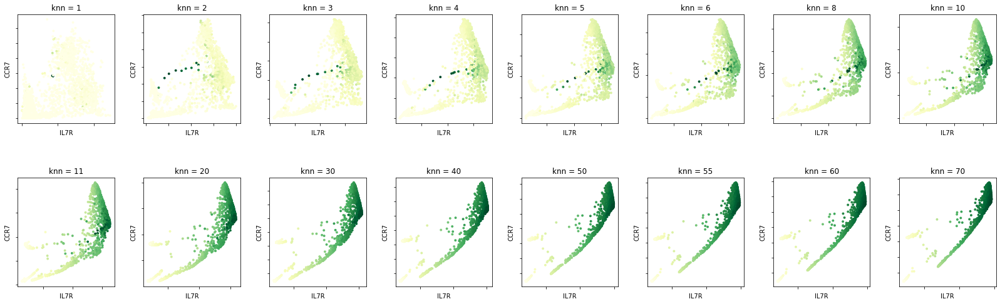

In [ ]:

# MAGIC EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

knn_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(knn_vec)):
    knn_curr = knn_vec[i]


    magic_operator = magic.MAGIC(t = 10, n_pca = 30, knn = knn_curr,decay= 5, random_state=1)
    imputated_magic =magic_operator.fit_transform(pcbm10x)


    x = imputated_magic["IL7R"]
    y = imputated_magic["CCR7"]
    c = imputated_magic["FOXP3"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('knn = ' + str(knn_curr))

plt.show()


Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.24 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.11 seconds.
    Calculating affinities...
    Calculated affinities in 0.12 seconds.
  Calculated graph and diffusion operator in 1.55 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.08 seconds.
Calculated MAGIC in 5.85 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.17 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.11 seconds.
    Calculating affinities...
    Calculated affinities in 0.12 seconds.
  Calculated graph and diffusion operator in 1.48 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.17 seconds.
Calculated MAGIC in 5.82 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.15 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.11 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.47 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.19 seconds.
Calculated MAGIC in 5.84 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.20 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.11 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.53 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.14 seconds.
Calculated MAGIC in 5.84 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.07 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.40 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.22 seconds.
Calculated MAGIC in 5.81 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.22 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.55 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.20 seconds.
Calculated MAGIC in 5.94 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.21 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.56 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.24 seconds.
Calculated MAGIC in 6.01 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.22 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.57 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.23 seconds.
Calculated MAGIC in 5.99 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.24 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.59 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.25 seconds.
Calculated MAGIC in 6.02 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.13 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.15 seconds.
    Calculating affinities...
    Calculated affinities in 0.17 seconds.
  Calculated graph and diffusion operator in 1.52 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.23 seconds.
Calculated MAGIC in 5.95 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.13 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.16 seconds.
    Calculating affinities...
    Calculated affinities in 0.19 seconds.
  Calculated graph and diffusion operator in 1.56 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.28 seconds.
Calculated MAGIC in 6.03 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.16 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.18 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 1.63 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.31 seconds.
Calculated MAGIC in 6.11 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.13 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.19 seconds.
    Calculating affinities...
    Calculated affinities in 0.25 seconds.
  Calculated graph and diffusion operator in 1.67 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.60 seconds.
Calculated MAGIC in 6.43 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.47 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.21 seconds.
    Calculating affinities...
    Calculated affinities in 0.26 seconds.
  Calculated graph and diffusion operator in 2.03 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.83 seconds.
Calculated MAGIC in 7.07 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.33 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.21 seconds.
    Calculating affinities...
    Calculated affinities in 0.25 seconds.
  Calculated graph and diffusion operator in 1.88 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.58 seconds.
Calculated MAGIC in 6.67 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.51 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.23 seconds.
    Calculating affinities...
    Calculated affinities in 0.30 seconds.
  Calculated graph and diffusion operator in 2.17 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.68 seconds.
Calculated MAGIC in 7.04 seconds.


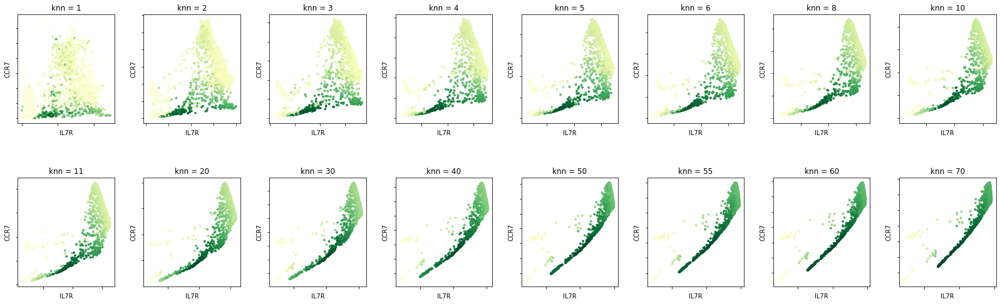

In [ ]:
# MAGIC EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

knn_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(knn_vec)):
    knn_curr = knn_vec[i]


    magic_operator = magic.MAGIC(t = 10, n_pca = 30, knn = knn_curr,decay= 5, random_state=1)
    imputated_magic =magic_operator.fit_transform(pcbm10x)


    x = imputated_magic["IL7R"]
    y = imputated_magic["CCR7"]
    c = imputated_magic["CD8A"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('knn = ' + str(knn_curr))

plt.show()

Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.30 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.11 seconds.
    Calculating affinities...
    Calculated affinities in 0.12 seconds.
  Calculated graph and diffusion operator in 1.62 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.67 seconds.
Calculated MAGIC in 6.55 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.35 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.11 seconds.
    Calculating affinities...
    Calculated affinities in 0.12 seconds.
  Calculated graph and diffusion operator in 1.65 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.44 seconds.
Calculated MAGIC in 6.29 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.20 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.54 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.33 seconds.
Calculated MAGIC in 6.07 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.19 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.53 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.52 seconds.
Calculated MAGIC in 6.24 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.42 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.75 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.65 seconds.
Calculated MAGIC in 6.59 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.26 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.60 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.93 seconds.
Calculated MAGIC in 6.72 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.44 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.15 seconds.
  Calculated graph and diffusion operator in 1.81 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.64 seconds.
Calculated MAGIC in 6.67 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.30 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.14 seconds.
    Calculating affinities...
    Calculated affinities in 0.15 seconds.
  Calculated graph and diffusion operator in 1.67 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.45 seconds.
Calculated MAGIC in 6.32 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.40 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.14 seconds.
    Calculating affinities...
    Calculated affinities in 0.16 seconds.
  Calculated graph and diffusion operator in 1.79 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.56 seconds.
Calculated MAGIC in 6.54 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.52 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.15 seconds.
    Calculating affinities...
    Calculated affinities in 0.18 seconds.
  Calculated graph and diffusion operator in 1.94 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.82 seconds.
Calculated MAGIC in 6.93 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.40 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.17 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 1.87 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.71 seconds.
Calculated MAGIC in 6.80 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.22 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.19 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 1.71 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.52 seconds.
Calculated MAGIC in 6.40 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.24 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.20 seconds.
    Calculating affinities...
    Calculated affinities in 0.26 seconds.
  Calculated graph and diffusion operator in 1.80 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.58 seconds.
Calculated MAGIC in 6.56 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.32 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.21 seconds.
    Calculating affinities...
    Calculated affinities in 0.24 seconds.
  Calculated graph and diffusion operator in 1.90 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.81 seconds.
Calculated MAGIC in 6.90 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.36 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.22 seconds.
    Calculating affinities...
    Calculated affinities in 0.25 seconds.
  Calculated graph and diffusion operator in 1.94 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.13 seconds.
Calculated MAGIC in 7.32 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.46 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.24 seconds.
    Calculating affinities...
    Calculated affinities in 0.40 seconds.
  Calculated graph and diffusion operator in 2.27 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.21 seconds.
Calculated MAGIC in 7.71 seconds.


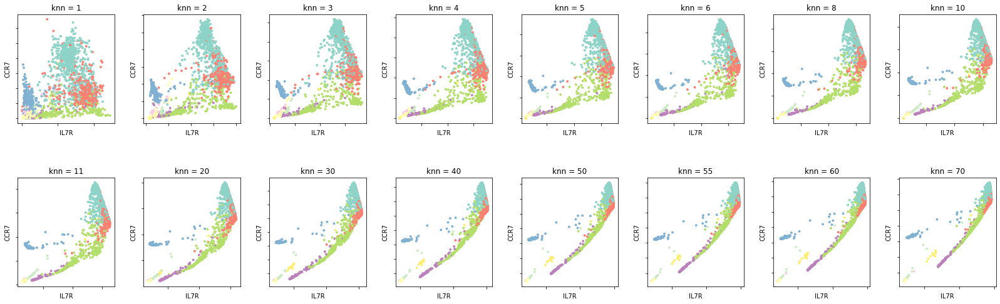

In [ ]:
# MAGIC EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()
a = clusters['clus'].to_numpy()
a.shape
import magic

knn_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(knn_vec)):
    knn_curr = knn_vec[i]


    magic_operator = magic.MAGIC(t = 10, n_pca = 30, knn = knn_curr,decay= 5, random_state=1)
    imputated_magic =magic_operator.fit_transform(pcbm10x)


    x = imputated_magic["IL7R"]
    y = imputated_magic["CCR7"]
    c = imputated_magic["CD8A"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=a, cmap=cm.Set3)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('knn = ' + str(knn_curr))
   #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()


# scPHENIX EVALUATION knn(cell information shaering) with t = 10

process start Sat Sep 25 20:02:33 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Sat Sep 25 20:02:38 2021 Finding Nearest Neighbors
Sat Sep 25 20:02:38 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3697968 edges.  This is not a problem as no vertices were disconnected.
Sat Sep 25 20:02:38 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sat Sep 25 20:02:48 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity

	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sat Sep 25 20:05:05 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Sat Sep 25 20:05:11 2021
process start Sat Sep 25 20:05:11 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Sat Sep 25 20:05:15 2021 Finding Nearest Neighbors
Sat Sep 25 20:05:15 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3697968 edges.  This is not a problem as no vertices were disconnected.
Sat Sep 25 20:05:15 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	comple

	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sat Sep 25 20:07:32 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Sat Sep 25 20:07:38 2021


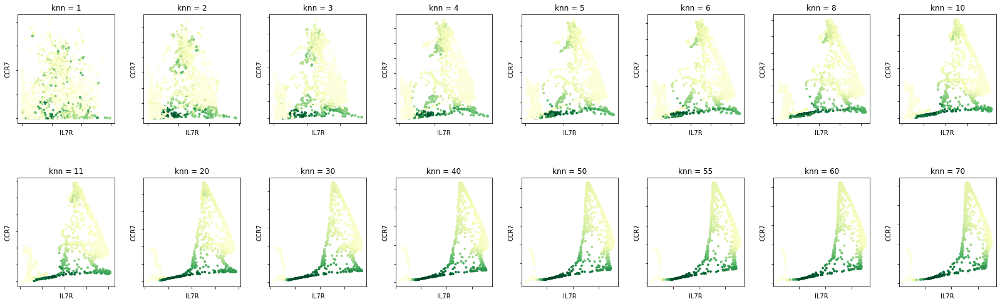

In [ ]:
# phenix  EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

knn_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(knn_vec)):
    knn_curr = knn_vec[i]


    pca_data= run_pca(pcbm10x,n_components=30, random_state=1)

    umap_data= run_umap(pca_data,n_components=40,n_neighbors=10,verbose= True,metric='cosine',min_dist=0.3,n_epochs=2000,random_state=1,negative_sample_rate=1)

    IMPUTATED_DATA_sc_PHENIX = sc_PHENIX(pcbm10x ,umap_data,t=10,knn=knn_curr,decay=5)
    df_new_curr = IMPUTATED_DATA_sc_PHENIX


    x = IMPUTATED_DATA_sc_PHENIX["IL7R"]
    y = IMPUTATED_DATA_sc_PHENIX["CCR7"]
    c = IMPUTATED_DATA_sc_PHENIX["CD8A"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('knn = ' + str(knn_curr))
    #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()

process start Sat Sep 25 20:07:39 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Sat Sep 25 20:07:43 2021 Finding Nearest Neighbors
Sat Sep 25 20:07:43 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3697968 edges.  This is not a problem as no vertices were disconnected.
Sat Sep 25 20:07:43 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sat Sep 25 20:07:50 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity

	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sat Sep 25 20:09:59 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Sat Sep 25 20:10:05 2021
process start Sat Sep 25 20:10:05 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Sat Sep 25 20:10:09 2021 Finding Nearest Neighbors
Sat Sep 25 20:10:09 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3697968 edges.  This is not a problem as no vertices were disconnected.
Sat Sep 25 20:10:09 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	comple

	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sat Sep 25 20:12:26 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Sat Sep 25 20:12:32 2021


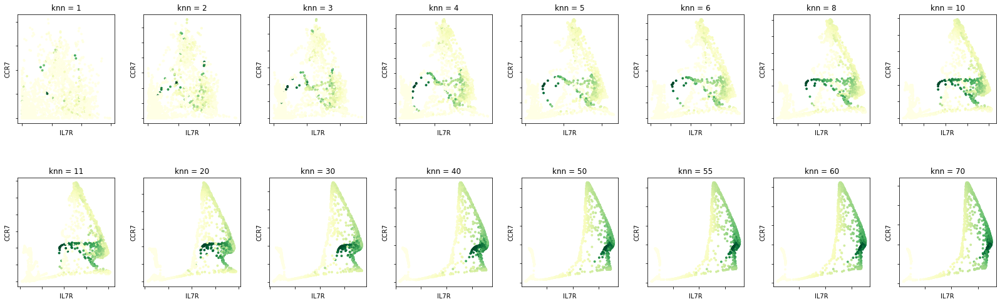

In [ ]:
# phenix  EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

knn_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(knn_vec)):
    knn_curr = knn_vec[i]


    pca_data= run_pca(pcbm10x,n_components=30, random_state=1)

    umap_data= run_umap(pca_data,n_components=40,n_neighbors=10,verbose= True,metric='cosine',min_dist=0.3,n_epochs=2000,random_state=1,negative_sample_rate=1)

    IMPUTATED_DATA_sc_PHENIX = sc_PHENIX(pcbm10x ,umap_data,t=10,knn=knn_curr,decay=5)
    df_new_curr = IMPUTATED_DATA_sc_PHENIX


    x = IMPUTATED_DATA_sc_PHENIX["IL7R"]
    y = IMPUTATED_DATA_sc_PHENIX["CCR7"]
    c = IMPUTATED_DATA_sc_PHENIX["FOXP3"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('knn = ' + str(knn_curr))
    #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()

process start Sat Sep 25 20:12:33 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Sat Sep 25 20:12:37 2021 Finding Nearest Neighbors
Sat Sep 25 20:12:37 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3697968 edges.  This is not a problem as no vertices were disconnected.
Sat Sep 25 20:12:37 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sat Sep 25 20:12:45 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity

	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sat Sep 25 20:15:07 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Sat Sep 25 20:15:15 2021
process start Sat Sep 25 20:15:15 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Sat Sep 25 20:15:19 2021 Finding Nearest Neighbors
Sat Sep 25 20:15:19 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3697968 edges.  This is not a problem as no vertices were disconnected.
Sat Sep 25 20:15:19 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	comple

	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sat Sep 25 20:17:33 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Sat Sep 25 20:17:40 2021


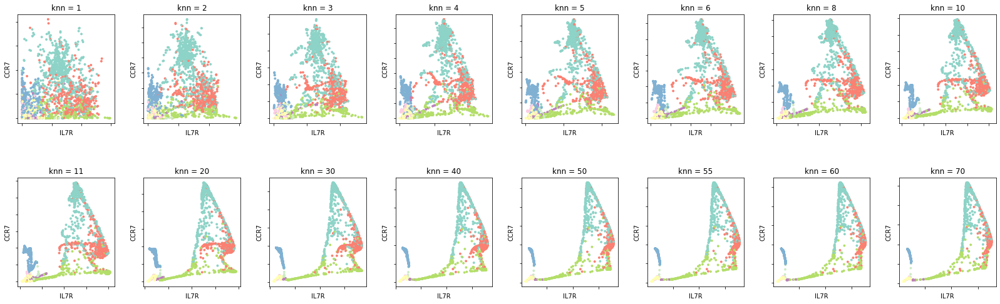

In [ ]:
# phenix  EVALUATION KNN
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()
a = clusters['clus'].to_numpy()
import magic

knn_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(knn_vec)):
    knn_curr = knn_vec[i]


    pca_data= run_pca(pcbm10x,n_components=30, random_state=1)

    umap_data= run_umap(pca_data,n_components=40,n_neighbors=10,verbose= True,metric='cosine',min_dist=0.3,n_epochs=2000,random_state=1,negative_sample_rate=1)

    IMPUTATED_DATA_sc_PHENIX = sc_PHENIX(pcbm10x ,umap_data,t=10,knn=knn_curr,decay=5)
    df_new_curr = IMPUTATED_DATA_sc_PHENIX


    x = IMPUTATED_DATA_sc_PHENIX["IL7R"]
    y = IMPUTATED_DATA_sc_PHENIX["CCR7"]
    c = IMPUTATED_DATA_sc_PHENIX["FOXP3"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=a, cmap=cm.Set3)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('knn = ' + str(knn_curr))
    #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()

# MAGIC EVALUATION t,                   knn= 5 PCA=30

Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.37 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.19 seconds.
  Calculated graph and diffusion operator in 1.81 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 2.49 seconds.
Calculated MAGIC in 4.61 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.45 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.15 seconds.
  Calculated graph and diffusion operator in 1.80 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 2.88 seconds.
Calculated MAGIC in 4.86 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.31 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.65 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.30 seconds.
Calculated MAGIC in 5.16 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.15 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.48 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.38 seconds.
Calculated MAGIC in 5.05 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.27 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.16 seconds.
  Calculated graph and diffusion operator in 1.63 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.03 seconds.
Calculated MAGIC in 5.84 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.64 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.99 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.36 seconds.
Calculated MAGIC in 6.60 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.46 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.15 seconds.
  Calculated graph and diffusion operator in 1.82 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.16 seconds.
Calculated MAGIC in 6.15 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.28 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.61 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.72 seconds.
Calculated MAGIC in 6.51 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.50 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.85 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.14 seconds.
Calculated MAGIC in 7.24 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.38 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.73 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.30 seconds.
Calculated MAGIC in 7.22 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.43 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.79 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 6.33 seconds.
Calculated MAGIC in 8.33 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.39 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.74 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 6.18 seconds.
Calculated MAGIC in 8.14 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.88 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.16 seconds.
  Calculated graph and diffusion operator in 2.29 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 6.74 seconds.
Calculated MAGIC in 9.37 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.48 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.15 seconds.
  Calculated graph and diffusion operator in 1.83 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 7.27 seconds.
Calculated MAGIC in 9.30 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.29 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.65 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 6.67 seconds.
Calculated MAGIC in 8.52 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.33 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.68 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 6.76 seconds.
Calculated MAGIC in 8.66 seconds.


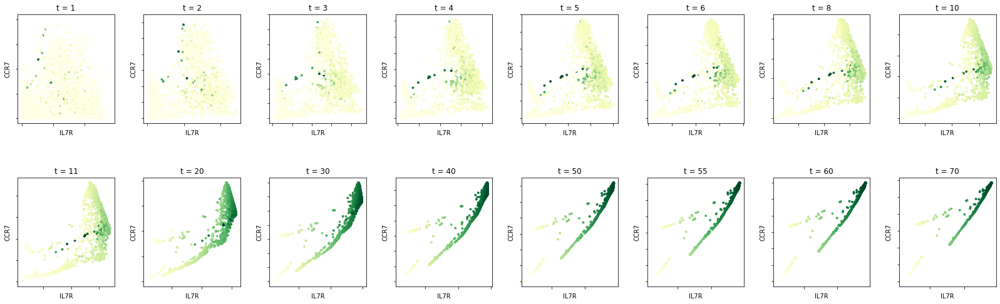

In [ ]:
# MAGIC EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

t_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(knn_vec)):
    t_curr = t_vec[i]


    magic_operator = magic.MAGIC(t = t_curr, n_pca = 30, knn =5,decay= 5, random_state=1)
    imputated_magic =magic_operator.fit_transform(pcbm10x)


    x = imputated_magic["IL7R"]
    y = imputated_magic["CCR7"]
    c = imputated_magic["FOXP3"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('t = ' + str(t_curr))

plt.show()


Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.45 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.15 seconds.
  Calculated graph and diffusion operator in 1.82 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 2.56 seconds.
Calculated MAGIC in 4.69 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.38 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.74 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.13 seconds.
Calculated MAGIC in 5.08 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.28 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.64 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.64 seconds.
Calculated MAGIC in 5.48 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.34 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.70 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.65 seconds.
Calculated MAGIC in 5.57 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.28 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.64 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.17 seconds.
Calculated MAGIC in 6.01 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.31 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.67 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.31 seconds.
Calculated MAGIC in 6.20 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.39 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.15 seconds.
  Calculated graph and diffusion operator in 1.76 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.22 seconds.
Calculated MAGIC in 6.20 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.35 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.15 seconds.
  Calculated graph and diffusion operator in 1.71 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.72 seconds.
Calculated MAGIC in 6.63 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.55 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.17 seconds.
    Calculating affinities...
    Calculated affinities in 0.15 seconds.
  Calculated graph and diffusion operator in 1.96 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.74 seconds.
Calculated MAGIC in 7.91 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.63 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.14 seconds.
    Calculating affinities...
    Calculated affinities in 0.15 seconds.
  Calculated graph and diffusion operator in 2.01 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.84 seconds.
Calculated MAGIC in 8.17 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.59 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.17 seconds.
  Calculated graph and diffusion operator in 1.98 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 6.89 seconds.
Calculated MAGIC in 9.11 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.65 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.14 seconds.
    Calculating affinities...
    Calculated affinities in 0.17 seconds.
  Calculated graph and diffusion operator in 2.06 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 6.98 seconds.
Calculated MAGIC in 9.37 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 3.34 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.19 seconds.
    Calculating affinities...
    Calculated affinities in 0.26 seconds.
  Calculated graph and diffusion operator in 3.93 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 8.78 seconds.
Calculated MAGIC in 13.26 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.64 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.15 seconds.
    Calculating affinities...
    Calculated affinities in 0.16 seconds.
  Calculated graph and diffusion operator in 2.04 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 8.79 seconds.
Calculated MAGIC in 11.10 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.80 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.15 seconds.
  Calculated graph and diffusion operator in 2.17 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 8.57 seconds.
Calculated MAGIC in 10.97 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.57 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.14 seconds.
    Calculating affinities...
    Calculated affinities in 0.16 seconds.
  Calculated graph and diffusion operator in 1.98 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 7.44 seconds.
Calculated MAGIC in 9.75 seconds.


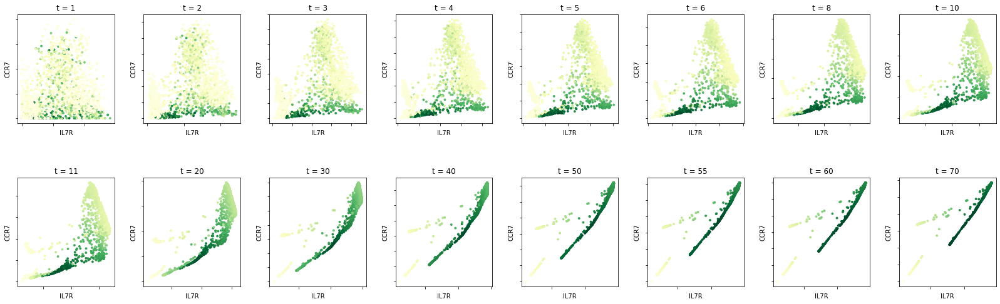

In [ ]:
# MAGIC EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

t_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(knn_vec)):
    t_curr = t_vec[i]


    magic_operator = magic.MAGIC(t = t_curr, n_pca = 30, knn =5,decay= 5, random_state=1)
    imputated_magic =magic_operator.fit_transform(pcbm10x)


    x = imputated_magic["IL7R"]
    y = imputated_magic["CCR7"]
    c = imputated_magic["CD8A"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('t = ' + str(t_curr))

plt.show()


Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.53 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.15 seconds.
    Calculating affinities...
    Calculated affinities in 0.18 seconds.
  Calculated graph and diffusion operator in 1.99 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 2.47 seconds.
Calculated MAGIC in 5.01 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.45 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.16 seconds.
  Calculated graph and diffusion operator in 1.82 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 2.83 seconds.
Calculated MAGIC in 4.84 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.39 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.74 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.19 seconds.
Calculated MAGIC in 5.22 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.31 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.65 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.08 seconds.
Calculated MAGIC in 4.94 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.18 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.52 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.45 seconds.
Calculated MAGIC in 5.18 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.42 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.75 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.95 seconds.
Calculated MAGIC in 5.92 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.31 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.66 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.03 seconds.
Calculated MAGIC in 5.87 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.31 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.65 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.36 seconds.
Calculated MAGIC in 6.20 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.38 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.73 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.85 seconds.
Calculated MAGIC in 6.79 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.22 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.56 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.32 seconds.
Calculated MAGIC in 7.09 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.94 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.15 seconds.
    Calculating affinities...
    Calculated affinities in 0.15 seconds.
  Calculated graph and diffusion operator in 2.38 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 7.72 seconds.
Calculated MAGIC in 10.45 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.65 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 2.01 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 6.24 seconds.
Calculated MAGIC in 8.63 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.28 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.17 seconds.
  Calculated graph and diffusion operator in 1.67 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 6.93 seconds.
Calculated MAGIC in 8.80 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.50 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.20 seconds.
    Calculating affinities...
    Calculated affinities in 0.16 seconds.
  Calculated graph and diffusion operator in 1.95 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 7.36 seconds.
Calculated MAGIC in 9.55 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.35 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.67 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 6.65 seconds.
Calculated MAGIC in 8.51 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.39 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.71 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 6.61 seconds.
Calculated MAGIC in 8.50 seconds.


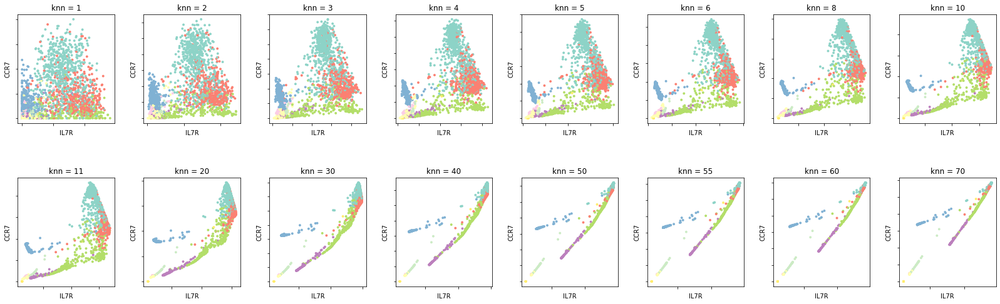

In [ ]:
# MAGIC EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()
a = clusters['clus'].to_numpy()
a.shape
import magic

t_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(knn_vec)):
    t_curr = t_vec[i]



    magic_operator = magic.MAGIC(t = t_curr, n_pca = 30, knn = 5,decay= 5, random_state=1)
    imputated_magic =magic_operator.fit_transform(pcbm10x)


    x = imputated_magic["IL7R"]
    y = imputated_magic["CCR7"]
    c = imputated_magic["CD8A"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=a, cmap=cm.Set3)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('knn = ' + str(t_curr))
   #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()

# scPPHENIX EVALUATION t,                   knn= 5 PCA=30

process start Sat Sep 25 22:39:52 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Sat Sep 25 22:39:56 2021 Finding Nearest Neighbors
Sat Sep 25 22:39:56 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3697968 edges.  This is not a problem as no vertices were disconnected.
Sat Sep 25 22:39:56 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sat Sep 25 22:40:04 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity

	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sat Sep 25 22:42:10 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Sat Sep 25 22:42:17 2021
process start Sat Sep 25 22:42:17 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Sat Sep 25 22:42:21 2021 Finding Nearest Neighbors
Sat Sep 25 22:42:21 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3697968 edges.  This is not a problem as no vertices were disconnected.
Sat Sep 25 22:42:21 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	comple

	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sat Sep 25 22:44:48 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Sat Sep 25 22:44:56 2021


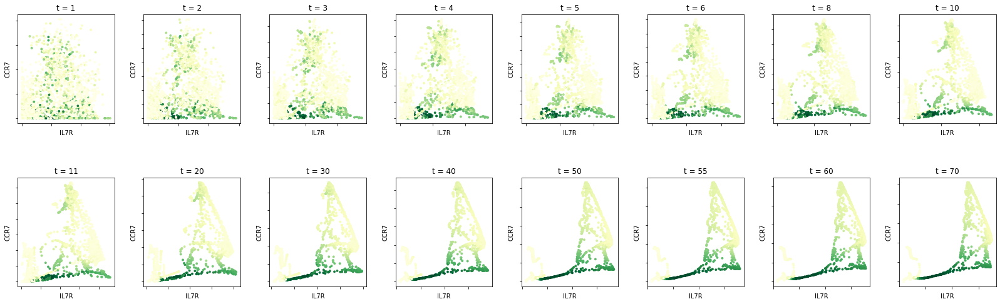

In [ ]:
# phenix  EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

t_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(knn_vec)):
    t_curr = t_vec[i]


    pca_data= run_pca(pcbm10x,n_components=30, random_state=1)

    umap_data= run_umap(pca_data,n_components=40,n_neighbors=10,verbose= True,metric='cosine',min_dist=0.3,n_epochs=2000,random_state=1,negative_sample_rate=1)

    IMPUTATED_DATA_sc_PHENIX = sc_PHENIX(pcbm10x ,umap_data,t=t_curr,knn=5,decay=5)
    df_new_curr = IMPUTATED_DATA_sc_PHENIX


    x = IMPUTATED_DATA_sc_PHENIX["IL7R"]
    y = IMPUTATED_DATA_sc_PHENIX["CCR7"]
    c = IMPUTATED_DATA_sc_PHENIX["CD8A"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('t = ' + str(t_curr))
    #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()

process start Sat Sep 25 22:44:57 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Sat Sep 25 22:45:01 2021 Finding Nearest Neighbors
Sat Sep 25 22:45:01 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3697968 edges.  This is not a problem as no vertices were disconnected.
Sat Sep 25 22:45:01 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sat Sep 25 22:45:09 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity

	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sat Sep 25 22:47:06 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Sat Sep 25 22:47:12 2021
process start Sat Sep 25 22:47:12 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Sat Sep 25 22:47:16 2021 Finding Nearest Neighbors
Sat Sep 25 22:47:16 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3697968 edges.  This is not a problem as no vertices were disconnected.
Sat Sep 25 22:47:16 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	comple

KeyboardInterrupt: 

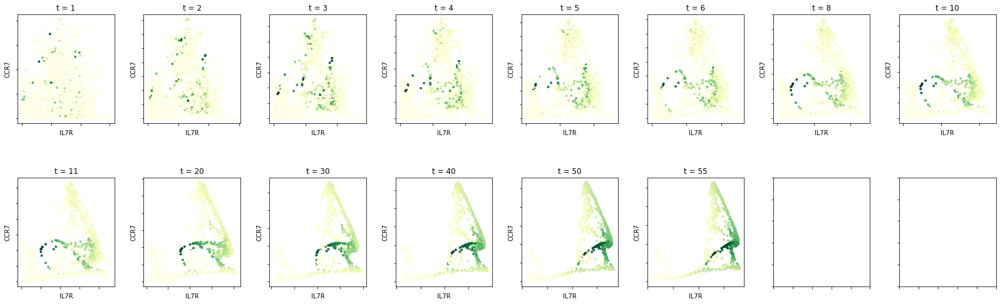

In [ ]:
# phenix  EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

t_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(knn_vec)):
    t_curr = t_vec[i]


    pca_data= run_pca(pcbm10x,n_components=30, random_state=1)

    umap_data= run_umap(pca_data,n_components=40,n_neighbors=10,verbose= True,metric='cosine',min_dist=0.3,n_epochs=2000,random_state=1,negative_sample_rate=1)

    IMPUTATED_DATA_sc_PHENIX = sc_PHENIX(pcbm10x ,umap_data,t=t_curr,knn=5,decay=5)
    df_new_curr = IMPUTATED_DATA_sc_PHENIX


    x = IMPUTATED_DATA_sc_PHENIX["IL7R"]
    y = IMPUTATED_DATA_sc_PHENIX["CCR7"]
    c = IMPUTATED_DATA_sc_PHENIX["FOXP3"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('t = ' + str(t_curr))
    #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()

In [ ]:
# phenix  EVALUATION KNN
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()
a = clusters['clus'].to_numpy()
import magic


t_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(knn_vec)):
    t_curr = t_vec[i]



    pca_data= run_pca(pcbm10x,n_components=30, random_state=1)

    umap_data= run_umap(pca_data,n_components=40,n_neighbors=10,verbose= True,metric='cosine',min_dist=0.3,n_epochs=2000,random_state=1,negative_sample_rate=1)

    IMPUTATED_DATA_sc_PHENIX = sc_PHENIX(pcbm10x ,umap_data,t=t_curr,knn=5,decay=5)
    df_new_curr = IMPUTATED_DATA_sc_PHENIX


    x = IMPUTATED_DATA_sc_PHENIX["IL7R"]
    y = IMPUTATED_DATA_sc_PHENIX["CCR7"]
    c = IMPUTATED_DATA_sc_PHENIX["FOXP3"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=a, cmap=cm.Set3)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('t = ' + str(t_curr))
    #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()

# MAGIC EVALUATION t,                   knn= 35 PCA=30

Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.78 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.19 seconds.
    Calculating affinities...
    Calculated affinities in 0.22 seconds.
  Calculated graph and diffusion operator in 2.35 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 2.71 seconds.
Calculated MAGIC in 5.69 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.43 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.17 seconds.
    Calculating affinities...
    Calculated affinities in 0.20 seconds.
  Calculated graph and diffusion operator in 1.92 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.21 seconds.
Calculated MAGIC in 5.40 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.38 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.19 seconds.
    Calculating affinities...
    Calculated affinities in 0.22 seconds.
  Calculated graph and diffusion operator in 1.89 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.95 seconds.
Calculated MAGIC in 6.06 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.65 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.18 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 2.13 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.18 seconds.
Calculated MAGIC in 6.50 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.58 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.17 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 2.06 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.69 seconds.
Calculated MAGIC in 7.00 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.42 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.17 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 1.89 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.72 seconds.
Calculated MAGIC in 6.82 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.35 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.17 seconds.
    Calculating affinities...
    Calculated affinities in 0.20 seconds.
  Calculated graph and diffusion operator in 1.82 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.48 seconds.
Calculated MAGIC in 6.49 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.41 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.17 seconds.
    Calculating affinities...
    Calculated affinities in 0.20 seconds.
  Calculated graph and diffusion operator in 1.88 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.04 seconds.
Calculated MAGIC in 7.14 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.49 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.17 seconds.
    Calculating affinities...
    Calculated affinities in 0.23 seconds.
  Calculated graph and diffusion operator in 1.98 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.72 seconds.
Calculated MAGIC in 7.91 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.35 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.17 seconds.
    Calculating affinities...
    Calculated affinities in 0.20 seconds.
  Calculated graph and diffusion operator in 1.80 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.72 seconds.
Calculated MAGIC in 7.73 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.36 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.17 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 1.84 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 6.43 seconds.
Calculated MAGIC in 8.49 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.20 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.18 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 1.67 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.93 seconds.
Calculated MAGIC in 7.82 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.23 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.18 seconds.
    Calculating affinities...
    Calculated affinities in 0.19 seconds.
  Calculated graph and diffusion operator in 1.69 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 7.94 seconds.
Calculated MAGIC in 9.85 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.40 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.18 seconds.
    Calculating affinities...
    Calculated affinities in 0.22 seconds.
  Calculated graph and diffusion operator in 1.89 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 8.20 seconds.
Calculated MAGIC in 10.40 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.32 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.18 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 1.79 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 7.70 seconds.
Calculated MAGIC in 9.67 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.34 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.18 seconds.
    Calculating affinities...
    Calculated affinities in 0.22 seconds.
  Calculated graph and diffusion operator in 1.82 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 7.74 seconds.
Calculated MAGIC in 9.79 seconds.


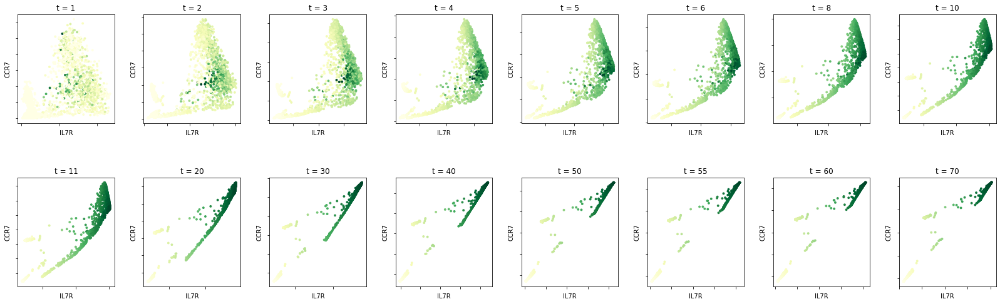

In [ ]:
# MAGIC EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

t_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(t_vec)):
    t_curr = t_vec[i]


    magic_operator = magic.MAGIC(t = t_curr, n_pca = 30, knn =35,decay= 5, random_state=1)
    imputated_magic =magic_operator.fit_transform(pcbm10x)


    x = imputated_magic["IL7R"]
    y = imputated_magic["CCR7"]
    c = imputated_magic["FOXP3"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('t = ' + str(t_curr))

plt.show()

Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.47 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.18 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 1.95 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.30 seconds.
Calculated MAGIC in 5.48 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.54 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.20 seconds.
    Calculating affinities...
    Calculated affinities in 0.29 seconds.
  Calculated graph and diffusion operator in 2.12 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.99 seconds.
Calculated MAGIC in 6.39 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.69 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.21 seconds.
    Calculating affinities...
    Calculated affinities in 0.22 seconds.
  Calculated graph and diffusion operator in 2.23 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.16 seconds.
Calculated MAGIC in 7.61 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.63 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.20 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 2.14 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.15 seconds.
Calculated MAGIC in 7.66 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.64 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.21 seconds.
    Calculating affinities...
    Calculated affinities in 0.23 seconds.
  Calculated graph and diffusion operator in 2.16 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.65 seconds.
Calculated MAGIC in 8.07 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.47 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.23 seconds.
    Calculating affinities...
    Calculated affinities in 0.22 seconds.
  Calculated graph and diffusion operator in 2.02 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.85 seconds.
Calculated MAGIC in 8.13 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.49 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.20 seconds.
    Calculating affinities...
    Calculated affinities in 0.22 seconds.
  Calculated graph and diffusion operator in 2.01 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.34 seconds.
Calculated MAGIC in 7.67 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.81 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.21 seconds.
    Calculating affinities...
    Calculated affinities in 0.23 seconds.
  Calculated graph and diffusion operator in 2.38 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 7.44 seconds.
Calculated MAGIC in 10.08 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.93 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.23 seconds.
    Calculating affinities...
    Calculated affinities in 0.23 seconds.
  Calculated graph and diffusion operator in 2.51 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 7.10 seconds.
Calculated MAGIC in 10.00 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.47 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.21 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 1.98 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 6.32 seconds.
Calculated MAGIC in 8.68 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.34 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.20 seconds.
    Calculating affinities...
    Calculated affinities in 0.28 seconds.
  Calculated graph and diffusion operator in 1.91 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 7.83 seconds.
Calculated MAGIC in 9.99 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.46 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.18 seconds.
    Calculating affinities...
    Calculated affinities in 0.20 seconds.
  Calculated graph and diffusion operator in 1.93 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 6.95 seconds.
Calculated MAGIC in 9.11 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.34 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.21 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 1.85 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 7.49 seconds.
Calculated MAGIC in 9.58 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.39 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.18 seconds.
    Calculating affinities...
    Calculated affinities in 0.20 seconds.
  Calculated graph and diffusion operator in 1.88 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 9.15 seconds.
Calculated MAGIC in 11.31 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.53 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.20 seconds.
    Calculating affinities...
    Calculated affinities in 0.22 seconds.
  Calculated graph and diffusion operator in 2.04 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 8.37 seconds.
Calculated MAGIC in 10.76 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.37 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.19 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 1.87 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 7.93 seconds.
Calculated MAGIC in 10.05 seconds.


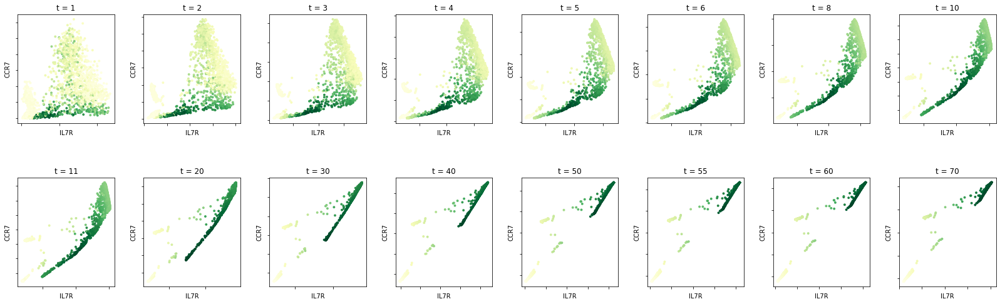

In [ ]:
# MAGIC EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

t_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(t_vec)):
    t_curr = t_vec[i]


    magic_operator = magic.MAGIC(t = t_curr, n_pca = 30, knn =35,decay= 5, random_state=1)
    imputated_magic =magic_operator.fit_transform(pcbm10x)


    x = imputated_magic["IL7R"]
    y = imputated_magic["CCR7"]
    c = imputated_magic["CD8A"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('t = ' + str(t_curr))

plt.show()

Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.28 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.17 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 1.76 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 2.14 seconds.
Calculated MAGIC in 4.37 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.21 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.17 seconds.
    Calculating affinities...
    Calculated affinities in 0.19 seconds.
  Calculated graph and diffusion operator in 1.66 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 2.66 seconds.
Calculated MAGIC in 4.53 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.19 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.17 seconds.
    Calculating affinities...
    Calculated affinities in 0.20 seconds.
  Calculated graph and diffusion operator in 1.65 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.30 seconds.
Calculated MAGIC in 5.16 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.28 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.17 seconds.
    Calculating affinities...
    Calculated affinities in 0.20 seconds.
  Calculated graph and diffusion operator in 1.74 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.40 seconds.
Calculated MAGIC in 5.33 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.09 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.17 seconds.
    Calculating affinities...
    Calculated affinities in 0.19 seconds.
  Calculated graph and diffusion operator in 1.53 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.78 seconds.
Calculated MAGIC in 5.51 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.23 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.17 seconds.
    Calculating affinities...
    Calculated affinities in 0.24 seconds.
  Calculated graph and diffusion operator in 1.75 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.84 seconds.
Calculated MAGIC in 5.77 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.22 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.17 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 1.68 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.91 seconds.
Calculated MAGIC in 5.79 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.12 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.18 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 1.59 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.95 seconds.
Calculated MAGIC in 6.72 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.29 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.18 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 1.78 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.09 seconds.
Calculated MAGIC in 7.05 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.51 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.18 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 1.98 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.03 seconds.
Calculated MAGIC in 7.18 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.23 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.18 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 1.71 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.99 seconds.
Calculated MAGIC in 7.90 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.24 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.20 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 1.73 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.84 seconds.
Calculated MAGIC in 7.77 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.32 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.19 seconds.
    Calculating affinities...
    Calculated affinities in 0.22 seconds.
  Calculated graph and diffusion operator in 1.81 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 6.19 seconds.
Calculated MAGIC in 8.20 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.38 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.21 seconds.
    Calculating affinities...
    Calculated affinities in 0.22 seconds.
  Calculated graph and diffusion operator in 1.89 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 7.24 seconds.
Calculated MAGIC in 9.32 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.31 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.19 seconds.
    Calculating affinities...
    Calculated affinities in 0.22 seconds.
  Calculated graph and diffusion operator in 1.80 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 6.72 seconds.
Calculated MAGIC in 8.70 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.22 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.19 seconds.
    Calculating affinities...
    Calculated affinities in 0.22 seconds.
  Calculated graph and diffusion operator in 1.72 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 6.70 seconds.
Calculated MAGIC in 8.62 seconds.


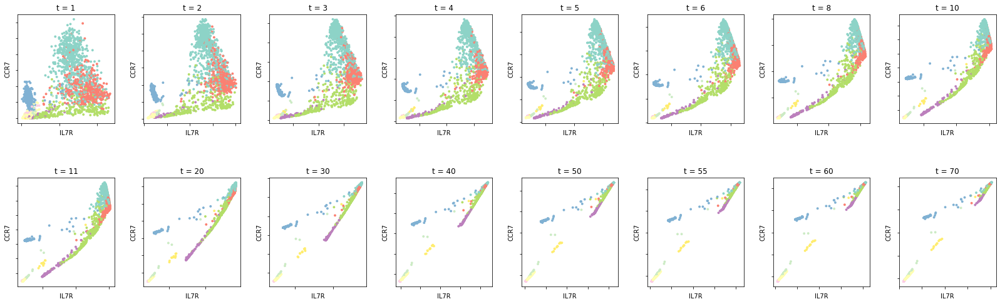

In [ ]:
# MAGIC EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()
a = clusters['clus'].to_numpy()
import magic

t_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(t_vec)):
    t_curr = t_vec[i]


    magic_operator = magic.MAGIC(t = t_curr, n_pca = 30, knn =35,decay= 5, random_state=1)
    imputated_magic =magic_operator.fit_transform(pcbm10x)


    x = imputated_magic["IL7R"]
    y = imputated_magic["CCR7"]

    im = axs[i].scatter(x, y, s=15, linewidths=0, c=a, cmap=cm.Set3)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('t = ' + str(t_curr))
   #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()

# phenix  EVALUATION t,                   knn= 35 PCA=30

process start Sat Sep 25 21:31:13 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Sat Sep 25 21:31:17 2021 Finding Nearest Neighbors
Sat Sep 25 21:31:17 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3697968 edges.  This is not a problem as no vertices were disconnected.
Sat Sep 25 21:31:17 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sat Sep 25 21:31:25 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity

	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sat Sep 25 21:33:32 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Sat Sep 25 21:33:39 2021
process start Sat Sep 25 21:33:39 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Sat Sep 25 21:33:43 2021 Finding Nearest Neighbors
Sat Sep 25 21:33:44 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3697968 edges.  This is not a problem as no vertices were disconnected.
Sat Sep 25 21:33:44 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	comple

	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sat Sep 25 21:55:45 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Sat Sep 25 21:55:52 2021


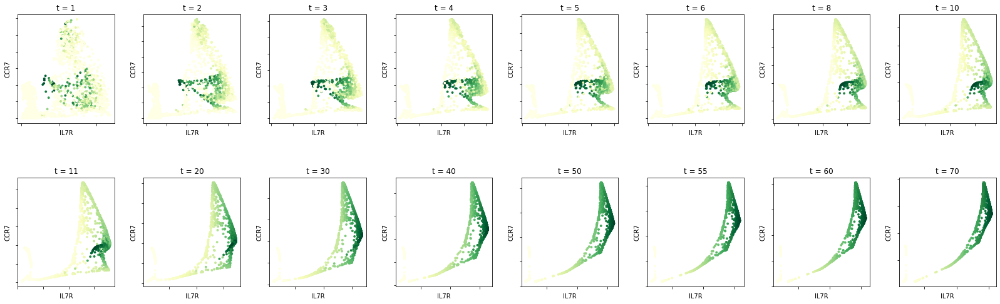

In [ ]:
# phenix  EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

t_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(t_vec)):
    t_curr = t_vec[i]


    pca_data= run_pca(pcbm10x,n_components=30, random_state=1)

    umap_data= run_umap(pca_data,n_components=40,n_neighbors=10,verbose= True,metric='cosine',min_dist=0.3,n_epochs=2000,random_state=1,negative_sample_rate=1)

    IMPUTATED_DATA_sc_PHENIX = sc_PHENIX(pcbm10x ,umap_data,t=t_curr,knn=35,decay=5)
    df_new_curr = IMPUTATED_DATA_sc_PHENIX


    x = IMPUTATED_DATA_sc_PHENIX["IL7R"]
    y = IMPUTATED_DATA_sc_PHENIX["CCR7"]
    c = IMPUTATED_DATA_sc_PHENIX["FOXP3"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('t = ' + str(t_curr))
    #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()

process start Sat Sep 25 21:55:53 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Sat Sep 25 21:55:57 2021 Finding Nearest Neighbors
Sat Sep 25 21:55:57 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3697968 edges.  This is not a problem as no vertices were disconnected.
Sat Sep 25 21:55:57 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sat Sep 25 21:56:05 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity

	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sat Sep 25 21:57:56 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Sat Sep 25 21:58:02 2021
process start Sat Sep 25 21:58:02 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Sat Sep 25 21:58:06 2021 Finding Nearest Neighbors
Sat Sep 25 21:58:06 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3697968 edges.  This is not a problem as no vertices were disconnected.
Sat Sep 25 21:58:06 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	comple

	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sat Sep 25 22:00:22 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Sat Sep 25 22:00:29 2021


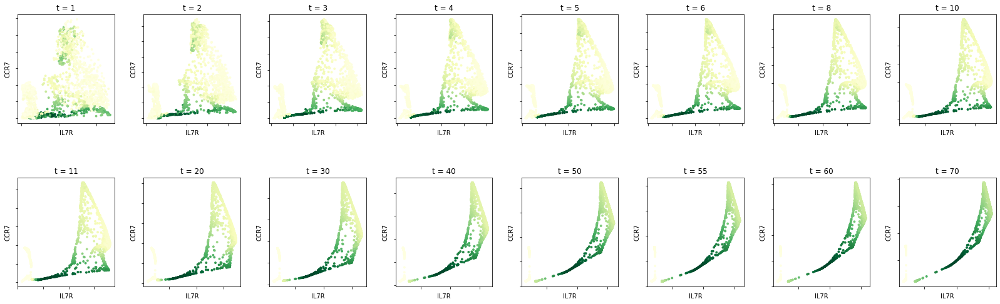

In [ ]:
# phenix  EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

t_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(t_vec)):
    t_curr = t_vec[i]


    pca_data= run_pca(pcbm10x,n_components=30, random_state=1)

    umap_data= run_umap(pca_data,n_components=40,n_neighbors=10,verbose= True,metric='cosine',min_dist=0.3,n_epochs=2000,random_state=1,negative_sample_rate=1)

    IMPUTATED_DATA_sc_PHENIX = sc_PHENIX(pcbm10x ,umap_data,t=t_curr,knn=35,decay=5)
    df_new_curr = IMPUTATED_DATA_sc_PHENIX


    x = IMPUTATED_DATA_sc_PHENIX["IL7R"]
    y = IMPUTATED_DATA_sc_PHENIX["CCR7"]
    c = IMPUTATED_DATA_sc_PHENIX["CD8A"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('t = ' + str(t_curr))
    #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()

process start Sat Sep 25 22:00:30 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Sat Sep 25 22:00:34 2021 Finding Nearest Neighbors
Sat Sep 25 22:00:34 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3697968 edges.  This is not a problem as no vertices were disconnected.
Sat Sep 25 22:00:34 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sat Sep 25 22:00:41 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity

	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sat Sep 25 22:02:32 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Sat Sep 25 22:02:38 2021
process start Sat Sep 25 22:02:38 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Sat Sep 25 22:02:42 2021 Finding Nearest Neighbors
Sat Sep 25 22:02:42 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3697968 edges.  This is not a problem as no vertices were disconnected.
Sat Sep 25 22:02:42 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	comple

	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sat Sep 25 22:04:57 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Sat Sep 25 22:05:05 2021


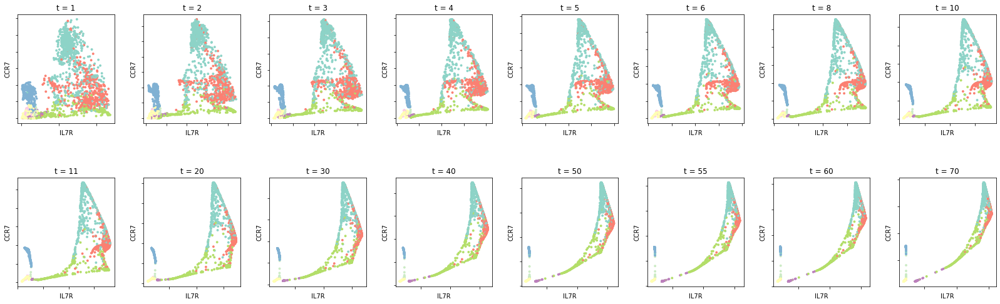

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()
a = clusters['clus'].to_numpy()
import magic


t_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(t_vec)):
    t_curr = t_vec[i]



    pca_data= run_pca(pcbm10x,n_components=30, random_state=1)

    umap_data= run_umap(pca_data,n_components=40,n_neighbors=10,verbose= True,metric='cosine',min_dist=0.3,n_epochs=2000,random_state=1,negative_sample_rate=1)

    IMPUTATED_DATA_sc_PHENIX = sc_PHENIX(pcbm10x ,umap_data,t=t_curr,knn=35,decay=5)
    df_new_curr = IMPUTATED_DATA_sc_PHENIX


    x = IMPUTATED_DATA_sc_PHENIX["IL7R"]
    y = IMPUTATED_DATA_sc_PHENIX["CCR7"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=a, cmap=cm.Set3)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('t = ' + str(t_curr))
    #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()

# MAGIC EVALUATION PCA           T=5       knn= 5

Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.93 seconds.
    Calculating KNN search...
    Calculating affinities...
    Calculated affinities in 0.02 seconds.
  Calculated graph and diffusion operator in 1.05 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.74 seconds.
Calculated MAGIC in 5.15 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.00 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.02 seconds.
    Calculating affinities...
    Calculated affinities in 0.03 seconds.
  Calculated graph and diffusion operator in 1.15 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.76 seconds.
Calculated MAGIC in 5.12 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.93 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.02 seconds.
    Calculating affinities...
    Calculated affinities in 0.03 seconds.
  Calculated graph and diffusion operator in 1.06 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.82 seconds.
Calculated MAGIC in 5.20 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.10 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.03 seconds.
    Calculating affinities...
    Calculated affinities in 0.05 seconds.
  Calculated graph and diffusion operator in 1.26 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.94 seconds.
Calculated MAGIC in 5.36 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.07 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.04 seconds.
    Calculating affinities...
    Calculated affinities in 0.06 seconds.
  Calculated graph and diffusion operator in 1.26 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.84 seconds.
Calculated MAGIC in 5.30 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.01 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.04 seconds.
    Calculating affinities...
    Calculated affinities in 0.05 seconds.
  Calculated graph and diffusion operator in 1.19 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.81 seconds.
Calculated MAGIC in 5.21 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.02 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.09 seconds.
    Calculating affinities...
    Calculated affinities in 0.08 seconds.
  Calculated graph and diffusion operator in 1.27 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.17 seconds.
Calculated MAGIC in 5.62 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.25 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.59 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.28 seconds.
Calculated MAGIC in 6.05 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.53 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.16 seconds.
    Calculating affinities...
    Calculated affinities in 0.17 seconds.
  Calculated graph and diffusion operator in 1.94 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.97 seconds.
Calculated MAGIC in 6.11 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.68 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.22 seconds.
    Calculating affinities...
    Calculated affinities in 0.22 seconds.
  Calculated graph and diffusion operator in 2.20 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.17 seconds.
Calculated MAGIC in 6.56 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.03 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.28 seconds.
    Calculating affinities...
    Calculated affinities in 0.28 seconds.
  Calculated graph and diffusion operator in 2.67 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.26 seconds.
Calculated MAGIC in 7.11 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.26 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.38 seconds.
    Calculating affinities...
    Calculated affinities in 0.37 seconds.
  Calculated graph and diffusion operator in 3.08 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.11 seconds.
Calculated MAGIC in 7.39 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.21 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.41 seconds.
    Calculating affinities...
    Calculated affinities in 0.41 seconds.
  Calculated graph and diffusion operator in 3.12 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.07 seconds.
Calculated MAGIC in 7.37 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.59 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.48 seconds.
    Calculating affinities...
    Calculated affinities in 0.46 seconds.
  Calculated graph and diffusion operator in 3.61 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.27 seconds.
Calculated MAGIC in 8.08 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.88 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.53 seconds.
    Calculating affinities...
    Calculated affinities in 0.50 seconds.
  Calculated graph and diffusion operator in 3.99 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.08 seconds.
Calculated MAGIC in 8.29 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 3.06 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.61 seconds.
    Calculating affinities...
    Calculated affinities in 0.62 seconds.
  Calculated graph and diffusion operator in 4.36 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.01 seconds.
Calculated MAGIC in 8.57 seconds.


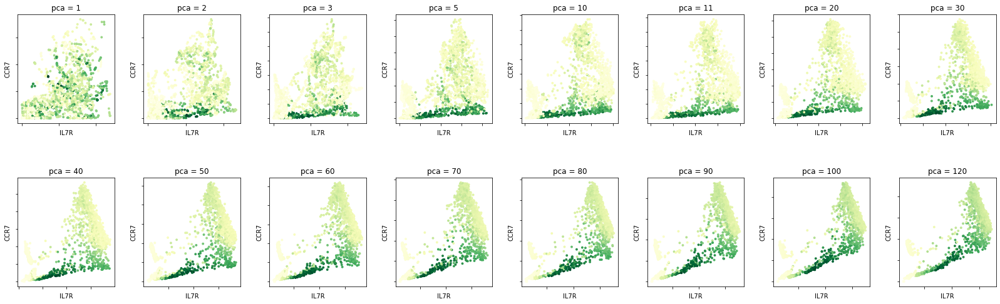

In [ ]:
# MAGIC EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

pca_vec = (1,2,3,5,10,11,20,30,40,50,60,70,80,90,100,120)


for i in range(len(pca_vec)):
    pca_curr = pca_vec[i]


    magic_operator = magic.MAGIC(t = 5, n_pca = pca_curr, knn =5,decay= 5, random_state=1)
    imputated_magic =magic_operator.fit_transform(pcbm10x)


    x = imputated_magic["IL7R"]
    y = imputated_magic["CCR7"]
    c = imputated_magic["CD8A"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('pca = ' + str(pca_curr))

plt.show()

Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.98 seconds.
    Calculating KNN search...
    Calculating affinities...
    Calculated affinities in 0.02 seconds.
  Calculated graph and diffusion operator in 1.10 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.52 seconds.
Calculated MAGIC in 5.90 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.08 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.02 seconds.
    Calculating affinities...
    Calculated affinities in 0.07 seconds.
  Calculated graph and diffusion operator in 1.32 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.24 seconds.
Calculated MAGIC in 6.06 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.91 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.02 seconds.
    Calculating affinities...
    Calculated affinities in 0.03 seconds.
  Calculated graph and diffusion operator in 1.03 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.13 seconds.
Calculated MAGIC in 5.34 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.80 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.03 seconds.
    Calculating affinities...
    Calculated affinities in 0.04 seconds.
  Calculated graph and diffusion operator in 0.95 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.02 seconds.
Calculated MAGIC in 5.18 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.83 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.04 seconds.
    Calculating affinities...
    Calculated affinities in 0.06 seconds.
  Calculated graph and diffusion operator in 1.01 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.11 seconds.
Calculated MAGIC in 5.29 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.04 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.05 seconds.
    Calculating affinities...
    Calculated affinities in 0.06 seconds.
  Calculated graph and diffusion operator in 1.22 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.07 seconds.
Calculated MAGIC in 5.48 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.06 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.07 seconds.
    Calculating affinities...
    Calculated affinities in 0.09 seconds.
  Calculated graph and diffusion operator in 1.30 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.15 seconds.
Calculated MAGIC in 5.64 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.31 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.65 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.22 seconds.
Calculated MAGIC in 6.06 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.63 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.17 seconds.
    Calculating affinities...
    Calculated affinities in 0.17 seconds.
  Calculated graph and diffusion operator in 2.05 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.22 seconds.
Calculated MAGIC in 6.48 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.67 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.23 seconds.
    Calculating affinities...
    Calculated affinities in 0.23 seconds.
  Calculated graph and diffusion operator in 2.21 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.18 seconds.
Calculated MAGIC in 6.57 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.86 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.28 seconds.
    Calculating affinities...
    Calculated affinities in 0.28 seconds.
  Calculated graph and diffusion operator in 2.50 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.12 seconds.
Calculated MAGIC in 6.81 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.11 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.39 seconds.
    Calculating affinities...
    Calculated affinities in 0.36 seconds.
  Calculated graph and diffusion operator in 2.94 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.26 seconds.
Calculated MAGIC in 7.39 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.34 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.43 seconds.
    Calculating affinities...
    Calculated affinities in 0.41 seconds.
  Calculated graph and diffusion operator in 3.26 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.58 seconds.
Calculated MAGIC in 9.06 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 3.09 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.49 seconds.
    Calculating affinities...
    Calculated affinities in 0.49 seconds.
  Calculated graph and diffusion operator in 4.16 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.32 seconds.
Calculated MAGIC in 8.83 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.80 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.53 seconds.
    Calculating affinities...
    Calculated affinities in 0.51 seconds.
  Calculated graph and diffusion operator in 3.92 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.36 seconds.
Calculated MAGIC in 8.54 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 3.34 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.64 seconds.
    Calculating affinities...
    Calculated affinities in 0.60 seconds.
  Calculated graph and diffusion operator in 4.66 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.41 seconds.
Calculated MAGIC in 9.28 seconds.


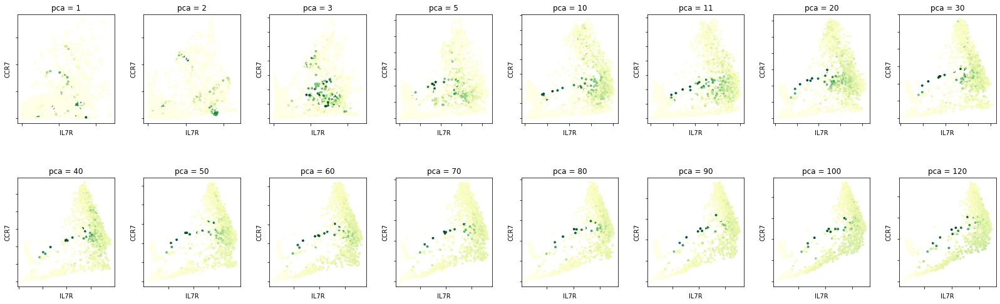

In [ ]:
# MAGIC EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

pca_vec = (1,2,3,5,10,11,20,30,40,50,60,70,80,90,100,120)


for i in range(len(pca_vec)):
    pca_curr = pca_vec[i]


    magic_operator = magic.MAGIC(t = 5, n_pca = pca_curr, knn =5,decay= 5, random_state=1)
    imputated_magic =magic_operator.fit_transform(pcbm10x)


    x = imputated_magic["IL7R"]
    y = imputated_magic["CCR7"]
    c = imputated_magic["FOXP3"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('pca = ' + str(pca_curr))

plt.show()

Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.90 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.01 seconds.
    Calculating affinities...
    Calculated affinities in 0.03 seconds.
  Calculated graph and diffusion operator in 1.04 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.15 seconds.
Calculated MAGIC in 5.43 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.86 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.02 seconds.
    Calculating affinities...
    Calculated affinities in 0.02 seconds.
  Calculated graph and diffusion operator in 0.97 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.07 seconds.
Calculated MAGIC in 5.23 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.79 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.02 seconds.
    Calculating affinities...
    Calculated affinities in 0.03 seconds.
  Calculated graph and diffusion operator in 0.92 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.08 seconds.
Calculated MAGIC in 5.22 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.83 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.03 seconds.
    Calculating affinities...
    Calculated affinities in 0.04 seconds.
  Calculated graph and diffusion operator in 0.98 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.43 seconds.
Calculated MAGIC in 5.62 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.09 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.05 seconds.
    Calculating affinities...
    Calculated affinities in 0.08 seconds.
  Calculated graph and diffusion operator in 1.30 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.32 seconds.
Calculated MAGIC in 5.79 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.05 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.05 seconds.
    Calculating affinities...
    Calculated affinities in 0.06 seconds.
  Calculated graph and diffusion operator in 1.24 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.30 seconds.
Calculated MAGIC in 5.74 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.16 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.08 seconds.
    Calculating affinities...
    Calculated affinities in 0.09 seconds.
  Calculated graph and diffusion operator in 1.41 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.23 seconds.
Calculated MAGIC in 5.84 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.32 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.67 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.13 seconds.
Calculated MAGIC in 5.99 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.48 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.16 seconds.
    Calculating affinities...
    Calculated affinities in 0.19 seconds.
  Calculated graph and diffusion operator in 1.90 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.13 seconds.
Calculated MAGIC in 6.21 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.68 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.24 seconds.
    Calculating affinities...
    Calculated affinities in 0.24 seconds.
  Calculated graph and diffusion operator in 2.23 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.10 seconds.
Calculated MAGIC in 6.52 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.95 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.29 seconds.
    Calculating affinities...
    Calculated affinities in 0.29 seconds.
  Calculated graph and diffusion operator in 2.60 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.12 seconds.
Calculated MAGIC in 6.91 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.02 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.38 seconds.
    Calculating affinities...
    Calculated affinities in 0.37 seconds.
  Calculated graph and diffusion operator in 2.85 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.06 seconds.
Calculated MAGIC in 7.10 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.20 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.42 seconds.
    Calculating affinities...
    Calculated affinities in 0.40 seconds.
  Calculated graph and diffusion operator in 3.11 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.14 seconds.
Calculated MAGIC in 7.44 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.79 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.50 seconds.
    Calculating affinities...
    Calculated affinities in 0.48 seconds.
  Calculated graph and diffusion operator in 3.86 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.17 seconds.
Calculated MAGIC in 8.21 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.69 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.54 seconds.
    Calculating affinities...
    Calculated affinities in 0.49 seconds.
  Calculated graph and diffusion operator in 3.80 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.28 seconds.
Calculated MAGIC in 8.30 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 3.38 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.63 seconds.
    Calculating affinities...
    Calculated affinities in 0.60 seconds.
  Calculated graph and diffusion operator in 4.67 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.20 seconds.
Calculated MAGIC in 9.03 seconds.


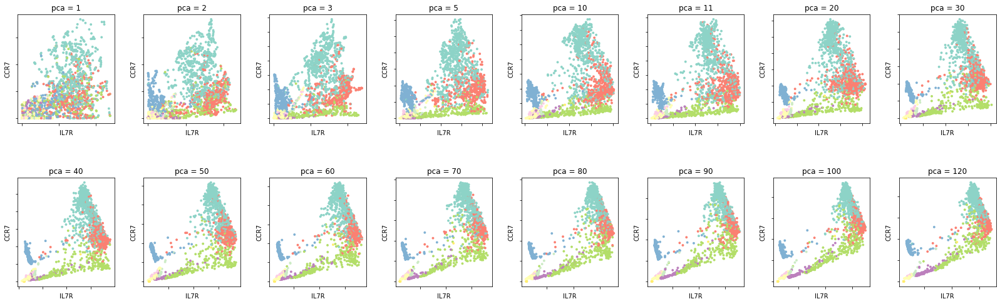

In [ ]:
# MAGIC EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn
a = clusters['clus'].to_numpy()

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

pca_vec = (1,2,3,5,10,11,20,30,40,50,60,70,80,90,100,120)


for i in range(len(pca_vec)):
    pca_curr = pca_vec[i]


    magic_operator = magic.MAGIC(t = 5, n_pca = pca_curr, knn =5,decay= 5, random_state=1)
    imputated_magic =magic_operator.fit_transform(pcbm10x)


    x = imputated_magic["IL7R"]
    y = imputated_magic["CCR7"]
    c = imputated_magic["FOXP3"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=a, cmap=cm.Set3)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('pca = ' + str(pca_curr))

plt.show()

# sc-phenix EVALUATION PCA           T=5       knn= 5

process start Sun Sep 26 00:36:35 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Sun Sep 26 00:36:39 2021 Finding Nearest Neighbors
Sun Sep 26 00:36:39 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 2865690 edges.  This is not a problem as no vertices were disconnected.
Sun Sep 26 00:36:39 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sun Sep 26 00:37:01 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity

	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sun Sep 26 00:38:54 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Sun Sep 26 00:38:59 2021
process start Sun Sep 26 00:38:59 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Sun Sep 26 00:39:03 2021 Finding Nearest Neighbors
Sun Sep 26 00:39:03 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3699510 edges.  This is not a problem as no vertices were disconnected.
Sun Sep 26 00:39:03 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	comple

	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sun Sep 26 00:41:16 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Sun Sep 26 00:41:21 2021


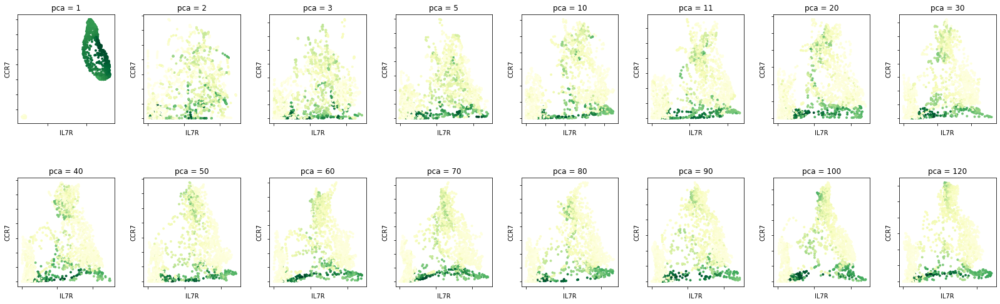

In [ ]:
# phenix  EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

pca_vec = (1,2,3,5,10,11,20,30,40,50,60,70,80,90,100,120)

for i in range(len(pca_vec)):
    pca_curr = pca_vec[i]



    pca_data= run_pca(pcbm10x,n_components=pca_curr, random_state=1)

    umap_data= run_umap(pca_data,n_components=40,n_neighbors=10,verbose= True,metric='cosine',min_dist=0.3,n_epochs=2000,random_state=1,negative_sample_rate=1)

    IMPUTATED_DATA_sc_PHENIX = sc_PHENIX(pcbm10x ,umap_data,t=5,knn=5,decay=5)
    df_new_curr = IMPUTATED_DATA_sc_PHENIX


    x = IMPUTATED_DATA_sc_PHENIX["IL7R"]
    y = IMPUTATED_DATA_sc_PHENIX["CCR7"]
    c = IMPUTATED_DATA_sc_PHENIX["CD8A"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('pca = ' + str(pca_curr))
    #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()

process start Sun Sep 26 00:46:12 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Sun Sep 26 00:46:16 2021 Finding Nearest Neighbors
Sun Sep 26 00:46:16 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 2865690 edges.  This is not a problem as no vertices were disconnected.
Sun Sep 26 00:46:16 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sun Sep 26 00:46:37 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity

	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sun Sep 26 00:48:35 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Sun Sep 26 00:48:41 2021
process start Sun Sep 26 00:48:41 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Sun Sep 26 00:48:46 2021 Finding Nearest Neighbors
Sun Sep 26 00:48:46 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3699510 edges.  This is not a problem as no vertices were disconnected.
Sun Sep 26 00:48:46 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	comple

	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sun Sep 26 00:51:10 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Sun Sep 26 00:51:15 2021


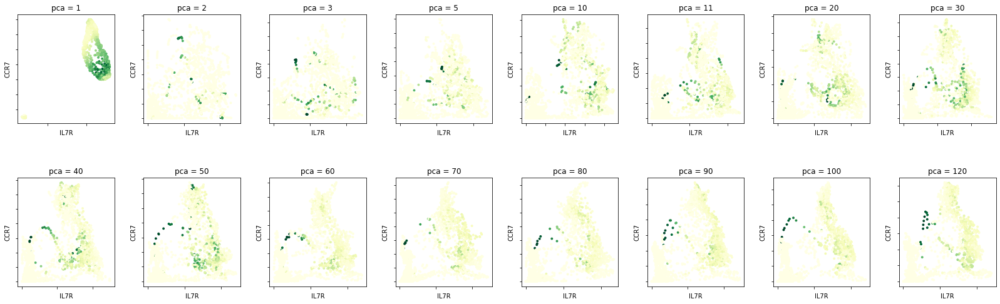

In [ ]:
# phenix  EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

pca_vec = (1,2,3,5,10,11,20,30,40,50,60,70,80,90,100,120)

for i in range(len(pca_vec)):
    pca_curr = pca_vec[i]



    pca_data= run_pca(pcbm10x,n_components=pca_curr, random_state=1)

    umap_data= run_umap(pca_data,n_components=40,n_neighbors=10,verbose= True,metric='cosine',min_dist=0.3,n_epochs=2000,random_state=1,negative_sample_rate=1)

    IMPUTATED_DATA_sc_PHENIX = sc_PHENIX(pcbm10x ,umap_data,t=5,knn=5,decay=5)
    df_new_curr = IMPUTATED_DATA_sc_PHENIX


    x = IMPUTATED_DATA_sc_PHENIX["IL7R"]
    y = IMPUTATED_DATA_sc_PHENIX["CCR7"]
    c = IMPUTATED_DATA_sc_PHENIX["FOXP3"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('pca = ' + str(pca_curr))
    #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()

process start Sun Sep 26 00:41:22 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Sun Sep 26 00:41:26 2021 Finding Nearest Neighbors
Sun Sep 26 00:41:26 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 2865690 edges.  This is not a problem as no vertices were disconnected.
Sun Sep 26 00:41:26 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sun Sep 26 00:41:47 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity

	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sun Sep 26 00:43:38 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Sun Sep 26 00:43:44 2021
process start Sun Sep 26 00:43:44 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Sun Sep 26 00:43:49 2021 Finding Nearest Neighbors
Sun Sep 26 00:43:49 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3699510 edges.  This is not a problem as no vertices were disconnected.
Sun Sep 26 00:43:49 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	comple

	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sun Sep 26 00:46:06 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Sun Sep 26 00:46:12 2021


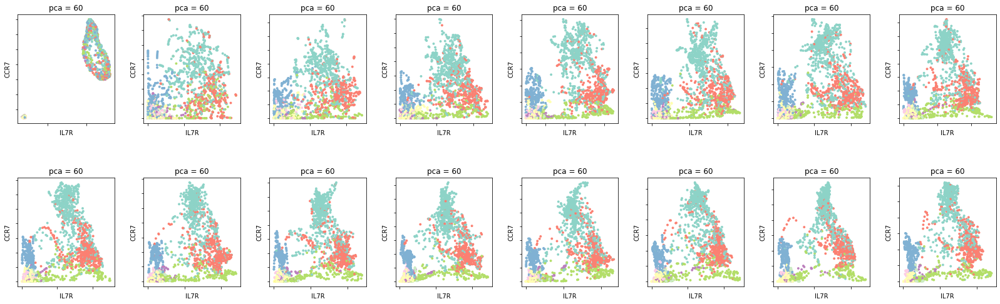

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()
a = clusters['clus'].to_numpy()
import magic


pca_vec = (1,2,3,5,10,11,20,30,40,50,60,70,80,90,100,120)

for i in range(len(pca_vec)):
    pca_curr = pca_vec[i]



    pca_data= run_pca(pcbm10x,n_components=pca_curr, random_state=1)

    umap_data= run_umap(pca_data,n_components=40,n_neighbors=10,verbose= True,metric='cosine',min_dist=0.3,n_epochs=2000,random_state=1,negative_sample_rate=1)

    IMPUTATED_DATA_sc_PHENIX = sc_PHENIX(pcbm10x ,umap_data,t=5,knn=5,decay=5)
    df_new_curr = IMPUTATED_DATA_sc_PHENIX


    x = IMPUTATED_DATA_sc_PHENIX["IL7R"]
    y = IMPUTATED_DATA_sc_PHENIX["CCR7"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=a, cmap=cm.Set3)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('pca = ' + str(t_curr))
    #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()

# MAGIC EVALUATION PCA           T=10 knn= 35

Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.90 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.03 seconds.
    Calculating affinities...
    Calculated affinities in 0.05 seconds.
  Calculated graph and diffusion operator in 1.05 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.03 seconds.
Calculated MAGIC in 6.24 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.88 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.06 seconds.
    Calculating affinities...
    Calculated affinities in 0.06 seconds.
  Calculated graph and diffusion operator in 1.08 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.70 seconds.
Calculated MAGIC in 6.03 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.91 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.05 seconds.
    Calculating affinities...
    Calculated affinities in 0.08 seconds.
  Calculated graph and diffusion operator in 1.14 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.06 seconds.
Calculated MAGIC in 6.40 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.92 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.06 seconds.
    Calculating affinities...
    Calculated affinities in 0.10 seconds.
  Calculated graph and diffusion operator in 1.20 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.83 seconds.
Calculated MAGIC in 6.24 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.21 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.09 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.55 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.07 seconds.
Calculated MAGIC in 6.81 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.06 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.09 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.38 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.94 seconds.
Calculated MAGIC in 6.50 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.03 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.17 seconds.
  Calculated graph and diffusion operator in 1.40 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.72 seconds.
Calculated MAGIC in 6.35 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.34 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.19 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 1.82 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.76 seconds.
Calculated MAGIC in 6.76 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.53 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.24 seconds.
    Calculating affinities...
    Calculated affinities in 0.25 seconds.
  Calculated graph and diffusion operator in 2.10 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.89 seconds.
Calculated MAGIC in 7.17 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.84 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.31 seconds.
    Calculating affinities...
    Calculated affinities in 0.30 seconds.
  Calculated graph and diffusion operator in 2.54 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.79 seconds.
Calculated MAGIC in 7.55 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.90 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.36 seconds.
    Calculating affinities...
    Calculated affinities in 0.36 seconds.
  Calculated graph and diffusion operator in 2.69 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.85 seconds.
Calculated MAGIC in 7.73 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.26 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.45 seconds.
    Calculating affinities...
    Calculated affinities in 0.44 seconds.
  Calculated graph and diffusion operator in 3.24 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.19 seconds.
Calculated MAGIC in 8.62 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.61 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.50 seconds.
    Calculating affinities...
    Calculated affinities in 0.51 seconds.
  Calculated graph and diffusion operator in 3.72 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.04 seconds.
Calculated MAGIC in 8.98 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.66 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.70 seconds.
    Calculating affinities...
    Calculated affinities in 0.60 seconds.
  Calculated graph and diffusion operator in 4.06 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.58 seconds.
Calculated MAGIC in 9.87 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 3.45 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.62 seconds.
    Calculating affinities...
    Calculated affinities in 0.61 seconds.
  Calculated graph and diffusion operator in 4.83 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.73 seconds.
Calculated MAGIC in 10.98 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 3.60 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.69 seconds.
    Calculating affinities...
    Calculated affinities in 0.69 seconds.
  Calculated graph and diffusion operator in 5.08 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.19 seconds.
Calculated MAGIC in 10.53 seconds.


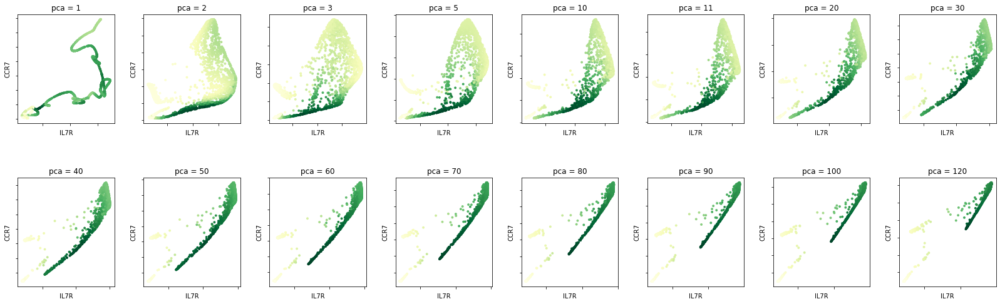

In [ ]:
# MAGIC EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

pca_vec = (1,2,3,5,10,11,20,30,40,50,60,70,80,90,100,120)


for i in range(len(pca_vec)):
    pca_curr = pca_vec[i]


    magic_operator = magic.MAGIC(t = 10, n_pca = pca_curr, knn =35,decay= 5, random_state=1)
    imputated_magic =magic_operator.fit_transform(pcbm10x)


    x = imputated_magic["IL7R"]
    y = imputated_magic["CCR7"]
    c = imputated_magic["CD8A"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('pca = ' + str(pca_curr))

plt.show()

Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.96 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.03 seconds.
    Calculating affinities...
    Calculated affinities in 0.03 seconds.
  Calculated graph and diffusion operator in 1.12 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.42 seconds.
Calculated MAGIC in 6.78 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.99 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.06 seconds.
    Calculating affinities...
    Calculated affinities in 0.10 seconds.
  Calculated graph and diffusion operator in 1.26 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.33 seconds.
Calculated MAGIC in 6.88 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.03 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.06 seconds.
    Calculating affinities...
    Calculated affinities in 0.09 seconds.
  Calculated graph and diffusion operator in 1.27 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.86 seconds.
Calculated MAGIC in 6.35 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.04 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.07 seconds.
    Calculating affinities...
    Calculated affinities in 0.12 seconds.
  Calculated graph and diffusion operator in 1.33 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.23 seconds.
Calculated MAGIC in 6.77 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.01 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.10 seconds.
    Calculating affinities...
    Calculated affinities in 0.16 seconds.
  Calculated graph and diffusion operator in 1.37 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.96 seconds.
Calculated MAGIC in 6.57 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.11 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.09 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.44 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.94 seconds.
Calculated MAGIC in 6.58 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.08 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.17 seconds.
  Calculated graph and diffusion operator in 1.46 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.23 seconds.
Calculated MAGIC in 6.89 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.55 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.21 seconds.
    Calculating affinities...
    Calculated affinities in 0.23 seconds.
  Calculated graph and diffusion operator in 2.08 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.14 seconds.
Calculated MAGIC in 7.43 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.88 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.24 seconds.
    Calculating affinities...
    Calculated affinities in 0.26 seconds.
  Calculated graph and diffusion operator in 2.49 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.46 seconds.
Calculated MAGIC in 8.20 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.21 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.31 seconds.
    Calculating affinities...
    Calculated affinities in 0.32 seconds.
  Calculated graph and diffusion operator in 2.93 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.94 seconds.
Calculated MAGIC in 8.09 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.96 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.37 seconds.
    Calculating affinities...
    Calculated affinities in 0.38 seconds.
  Calculated graph and diffusion operator in 2.79 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.84 seconds.
Calculated MAGIC in 7.80 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.12 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.46 seconds.
    Calculating affinities...
    Calculated affinities in 0.46 seconds.
  Calculated graph and diffusion operator in 3.12 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.76 seconds.
Calculated MAGIC in 8.07 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.28 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.49 seconds.
    Calculating affinities...
    Calculated affinities in 0.48 seconds.
  Calculated graph and diffusion operator in 3.34 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.77 seconds.
Calculated MAGIC in 8.34 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.55 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.58 seconds.
    Calculating affinities...
    Calculated affinities in 0.56 seconds.
  Calculated graph and diffusion operator in 3.78 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.77 seconds.
Calculated MAGIC in 8.73 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.98 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.59 seconds.
    Calculating affinities...
    Calculated affinities in 0.60 seconds.
  Calculated graph and diffusion operator in 4.30 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.83 seconds.
Calculated MAGIC in 9.37 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 3.14 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.70 seconds.
    Calculating affinities...
    Calculated affinities in 0.69 seconds.
  Calculated graph and diffusion operator in 4.61 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.64 seconds.
Calculated MAGIC in 9.45 seconds.


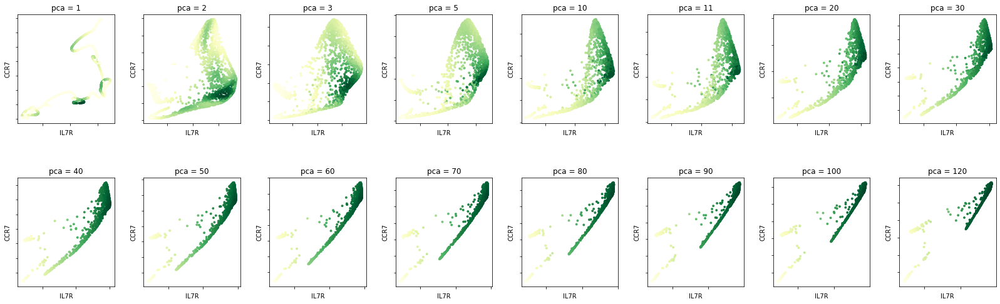

In [ ]:
# MAGIC EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

pca_vec = (1,2,3,5,10,11,20,30,40,50,60,70,80,90,100,120)


for i in range(len(pca_vec)):
    pca_curr = pca_vec[i]


    magic_operator = magic.MAGIC(t = 10, n_pca = pca_curr, knn =35,decay= 5, random_state=1)
    imputated_magic =magic_operator.fit_transform(pcbm10x)


    x = imputated_magic["IL7R"]
    y = imputated_magic["CCR7"]
    c = imputated_magic["FOXP3"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('pca = ' + str(pca_curr))

plt.show()

Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.88 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.02 seconds.
    Calculating affinities...
    Calculated affinities in 0.04 seconds.
  Calculated graph and diffusion operator in 1.04 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.59 seconds.
Calculated MAGIC in 5.82 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.85 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.05 seconds.
    Calculating affinities...
    Calculated affinities in 0.05 seconds.
  Calculated graph and diffusion operator in 1.04 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.66 seconds.
Calculated MAGIC in 5.91 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.89 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.06 seconds.
    Calculating affinities...
    Calculated affinities in 0.08 seconds.
  Calculated graph and diffusion operator in 1.12 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.73 seconds.
Calculated MAGIC in 6.08 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.86 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.07 seconds.
    Calculating affinities...
    Calculated affinities in 0.10 seconds.
  Calculated graph and diffusion operator in 1.12 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.83 seconds.
Calculated MAGIC in 6.18 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.96 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.09 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.27 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.73 seconds.
Calculated MAGIC in 6.22 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.08 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.09 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.40 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.35 seconds.
Calculated MAGIC in 6.97 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.19 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.19 seconds.
  Calculated graph and diffusion operator in 1.60 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.26 seconds.
Calculated MAGIC in 7.04 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.44 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.19 seconds.
    Calculating affinities...
    Calculated affinities in 0.22 seconds.
  Calculated graph and diffusion operator in 1.95 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.55 seconds.
Calculated MAGIC in 7.73 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.77 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.24 seconds.
    Calculating affinities...
    Calculated affinities in 0.25 seconds.
  Calculated graph and diffusion operator in 2.36 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.49 seconds.
Calculated MAGIC in 8.10 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.75 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.30 seconds.
    Calculating affinities...
    Calculated affinities in 0.35 seconds.
  Calculated graph and diffusion operator in 2.51 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 7.25 seconds.
Calculated MAGIC in 9.99 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 3.29 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.42 seconds.
    Calculating affinities...
    Calculated affinities in 0.46 seconds.
  Calculated graph and diffusion operator in 4.35 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 7.44 seconds.
Calculated MAGIC in 12.09 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.70 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.56 seconds.
    Calculating affinities...
    Calculated affinities in 0.58 seconds.
  Calculated graph and diffusion operator in 3.95 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 6.05 seconds.
Calculated MAGIC in 10.44 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.64 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.52 seconds.
    Calculating affinities...
    Calculated affinities in 0.52 seconds.
  Calculated graph and diffusion operator in 3.80 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.58 seconds.
Calculated MAGIC in 9.61 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.72 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.57 seconds.
    Calculating affinities...
    Calculated affinities in 0.54 seconds.
  Calculated graph and diffusion operator in 3.92 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.35 seconds.
Calculated MAGIC in 9.48 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.91 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.60 seconds.
    Calculating affinities...
    Calculated affinities in 0.58 seconds.
  Calculated graph and diffusion operator in 4.19 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.37 seconds.
Calculated MAGIC in 9.78 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 3.50 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.70 seconds.
    Calculating affinities...
    Calculated affinities in 0.68 seconds.
  Calculated graph and diffusion operator in 4.97 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.33 seconds.
Calculated MAGIC in 10.52 seconds.


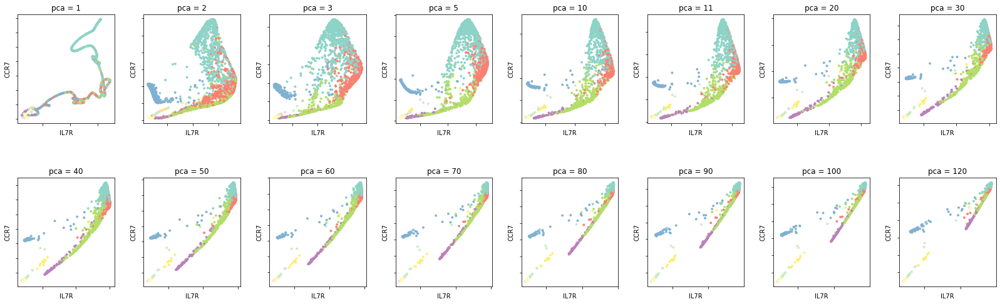

In [ ]:
# MAGIC EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn
a = clusters['clus'].to_numpy()

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

pca_vec = (1,2,3,5,10,11,20,30,40,50,60,70,80,90,100,120)


for i in range(len(pca_vec)):
    pca_curr = pca_vec[i]


    magic_operator = magic.MAGIC(t = 10, n_pca = pca_curr, knn =35,decay= 5, random_state=1)
    imputated_magic =magic_operator.fit_transform(pcbm10x)


    x = imputated_magic["IL7R"]
    y = imputated_magic["CCR7"]
    c = imputated_magic["FOXP3"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=a, cmap=cm.Set3)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('pca = ' + str(pca_curr))

plt.show()

# sc-phenix EVALUATION PCA           T=10       knn= 35

process start Sun Sep 26 00:51:17 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Sun Sep 26 00:51:20 2021 Finding Nearest Neighbors
Sun Sep 26 00:51:20 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 2865690 edges.  This is not a problem as no vertices were disconnected.
Sun Sep 26 00:51:20 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sun Sep 26 00:51:42 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity

	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sun Sep 26 00:53:48 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Sun Sep 26 00:53:55 2021
process start Sun Sep 26 00:53:55 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Sun Sep 26 00:53:59 2021 Finding Nearest Neighbors
Sun Sep 26 00:53:59 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 3699510 edges.  This is not a problem as no vertices were disconnected.
Sun Sep 26 00:53:59 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	comple

	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sun Sep 26 00:56:32 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Sun Sep 26 00:56:39 2021


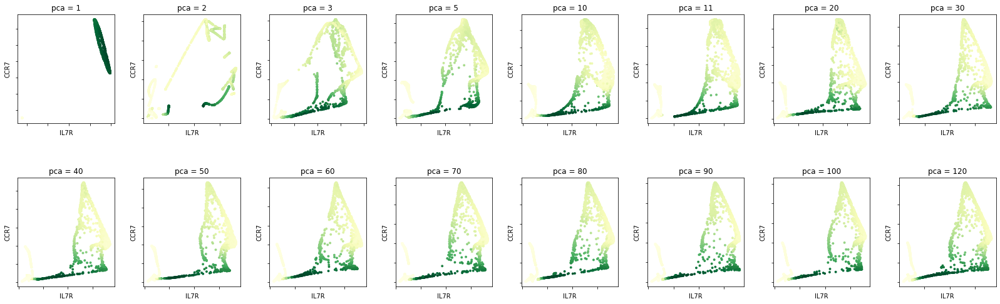

In [ ]:
# phenix  EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

pca_vec = (1,2,3,5,10,11,20,30,40,50,60,70,80,90,100,120)

for i in range(len(pca_vec)):
    pca_curr = pca_vec[i]



    pca_data= run_pca(pcbm10x,n_components=pca_curr, random_state=1)

    umap_data= run_umap(pca_data,n_components=40,n_neighbors=10,verbose= True,metric='cosine',min_dist=0.3,n_epochs=2000,random_state=1,negative_sample_rate=1)

    IMPUTATED_DATA_sc_PHENIX = sc_PHENIX(pcbm10x ,umap_data,t=10,knn=35,decay=5)
    df_new_curr = IMPUTATED_DATA_sc_PHENIX


    x = IMPUTATED_DATA_sc_PHENIX["IL7R"]
    y = IMPUTATED_DATA_sc_PHENIX["CCR7"]
    c = IMPUTATED_DATA_sc_PHENIX["CD8A"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('pca = ' + str(pca_curr))
    #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()

In [ ]:
# phenix  EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

pca_vec = (1,2,3,5,10,11,20,30,40,50,60,70,80,90,100,120)

for i in range(len(pca_vec)):
    pca_curr = pca_vec[i]



    pca_data= run_pca(pcbm10x,n_components=pca_curr, random_state=1)

    umap_data= run_umap(pca_data,n_components=40,n_neighbors=10,verbose= True,metric='cosine',min_dist=0.3,n_epochs=2000,random_state=1,negative_sample_rate=1)

    IMPUTATED_DATA_sc_PHENIX = sc_PHENIX(pcbm10x ,umap_data,t=10,knn=35,decay=5)
    df_new_curr = IMPUTATED_DATA_sc_PHENIX


    x = IMPUTATED_DATA_sc_PHENIX["IL7R"]
    y = IMPUTATED_DATA_sc_PHENIX["CCR7"]
    c = IMPUTATED_DATA_sc_PHENIX["FOXP3"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('pca = ' + str(pca_curr))
    #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()

process start Sun Sep 26 00:56:40 2021
UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0, metric='cosine',
     min_dist=0.3, n_components=40, n_epochs=2000, n_neighbors=10,
     negative_sample_rate=1, random_state=1, verbose=True)
Construct fuzzy simplicial set
Sun Sep 26 00:56:44 2021 Finding Nearest Neighbors
Sun Sep 26 00:56:44 2021 Finished Nearest Neighbor Search
Disconnection_distance = 1 has removed 2865690 edges.  This is not a problem as no vertices were disconnected.
Sun Sep 26 00:56:44 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Sun Sep 26 00:57:06 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()
a = clusters['clus'].to_numpy()
import magic


pca_vec = (1,2,3,5,10,11,20,30,40,50,60,70,80,90,100,120)

for i in range(len(pca_vec)):
    pca_curr = pca_vec[i]



    pca_data= run_pca(pcbm10x,n_components=pca_curr, random_state=1)

    umap_data= run_umap(pca_data,n_components=40,n_neighbors=10,verbose= True,metric='cosine',min_dist=0.3,n_epochs=2000,random_state=1,negative_sample_rate=1)

    IMPUTATED_DATA_sc_PHENIX = sc_PHENIX(pcbm10x ,umap_data,t=10,knn=35,decay=5)
    df_new_curr = IMPUTATED_DATA_sc_PHENIX


    x = IMPUTATED_DATA_sc_PHENIX["IL7R"]
    y = IMPUTATED_DATA_sc_PHENIX["CCR7"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=a, cmap=cm.Set3)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('pca = ' + str(t_curr))
    #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()

# MAGIC EVALUATION t  knn= 5

Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:168: FutureWarning:

Parameter `a` is deprecated and will be removed in a future version. Use `decay` instead



  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.74 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.11 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 2.07 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.24 seconds.
Calculated MAGIC in 6.78 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:168: FutureWarning:

Parameter `a` is deprecated and will be removed in a future version. Use `decay` instead



  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.24 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.11 seconds.
    Calculating affinities...
    Calculated affinities in 0.12 seconds.
  Calculated graph and diffusion operator in 1.55 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.80 seconds.
Calculated MAGIC in 5.59 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:168: FutureWarning:

Parameter `a` is deprecated and will be removed in a future version. Use `decay` instead

/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculating PCA...
    Calculated PCA in 1.05 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.11 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.37 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.83 seconds.
Calculated MAGIC in 5.35 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:168: FutureWarning:

Parameter `a` is deprecated and will be removed in a future version. Use `decay` instead

/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculating PCA...
    Calculated PCA in 1.20 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.11 seconds.
    Calculating affinities...
    Calculated affinities in 0.12 seconds.
  Calculated graph and diffusion operator in 1.52 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.09 seconds.
Calculated MAGIC in 5.78 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:168: FutureWarning:

Parameter `a` is deprecated and will be removed in a future version. Use `decay` instead



  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.30 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.17 seconds.
  Calculated graph and diffusion operator in 1.71 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.87 seconds.
Calculated MAGIC in 5.84 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:168: FutureWarning:

Parameter `a` is deprecated and will be removed in a future version. Use `decay` instead

/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculating PCA...
    Calculated PCA in 1.12 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 1.43 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.94 seconds.
Calculated MAGIC in 5.53 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:168: FutureWarning:

Parameter `a` is deprecated and will be removed in a future version. Use `decay` instead

/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculating PCA...
    Calculated PCA in 1.17 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.51 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.01 seconds.
Calculated MAGIC in 5.69 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:168: FutureWarning:

Parameter `a` is deprecated and will be removed in a future version. Use `decay` instead

/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculating PCA...
    Calculated PCA in 1.10 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.45 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.06 seconds.
Calculated MAGIC in 5.67 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:168: FutureWarning:

Parameter `a` is deprecated and will be removed in a future version. Use `decay` instead

/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculating PCA...
    Calculated PCA in 1.12 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.46 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.09 seconds.
Calculated MAGIC in 5.73 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:168: FutureWarning:

Parameter `a` is deprecated and will be removed in a future version. Use `decay` instead

/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculating PCA...
    Calculated PCA in 1.13 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.14 seconds.
    Calculating affinities...
    Calculated affinities in 0.16 seconds.
  Calculated graph and diffusion operator in 1.52 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.19 seconds.
Calculated MAGIC in 5.87 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:168: FutureWarning:

Parameter `a` is deprecated and will be removed in a future version. Use `decay` instead

/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculating PCA...
    Calculated PCA in 1.25 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.16 seconds.
    Calculating affinities...
    Calculated affinities in 0.19 seconds.
  Calculated graph and diffusion operator in 1.69 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.40 seconds.
Calculated MAGIC in 6.28 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:168: FutureWarning:

Parameter `a` is deprecated and will be removed in a future version. Use `decay` instead

/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculating PCA...
    Calculated PCA in 1.28 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.18 seconds.
    Calculating affinities...
    Calculated affinities in 0.20 seconds.
  Calculated graph and diffusion operator in 1.75 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.46 seconds.
Calculated MAGIC in 6.39 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:168: FutureWarning:

Parameter `a` is deprecated and will be removed in a future version. Use `decay` instead

/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculating PCA...
    Calculated PCA in 1.22 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.19 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 1.73 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.97 seconds.
Calculated MAGIC in 6.94 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:168: FutureWarning:

Parameter `a` is deprecated and will be removed in a future version. Use `decay` instead



  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 3.41 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.23 seconds.
    Calculating affinities...
    Calculated affinities in 0.26 seconds.
  Calculated graph and diffusion operator in 4.00 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.65 seconds.
Calculated MAGIC in 9.08 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:168: FutureWarning:

Parameter `a` is deprecated and will be removed in a future version. Use `decay` instead



  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.24 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.21 seconds.
    Calculating affinities...
    Calculated affinities in 0.20 seconds.
  Calculated graph and diffusion operator in 1.76 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.34 seconds.
Calculated MAGIC in 6.44 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:168: FutureWarning:

Parameter `a` is deprecated and will be removed in a future version. Use `decay` instead

/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculating PCA...
    Calculated PCA in 1.22 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.22 seconds.
    Calculating affinities...
    Calculated affinities in 0.24 seconds.
  Calculated graph and diffusion operator in 1.80 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.57 seconds.
Calculated MAGIC in 6.55 seconds.


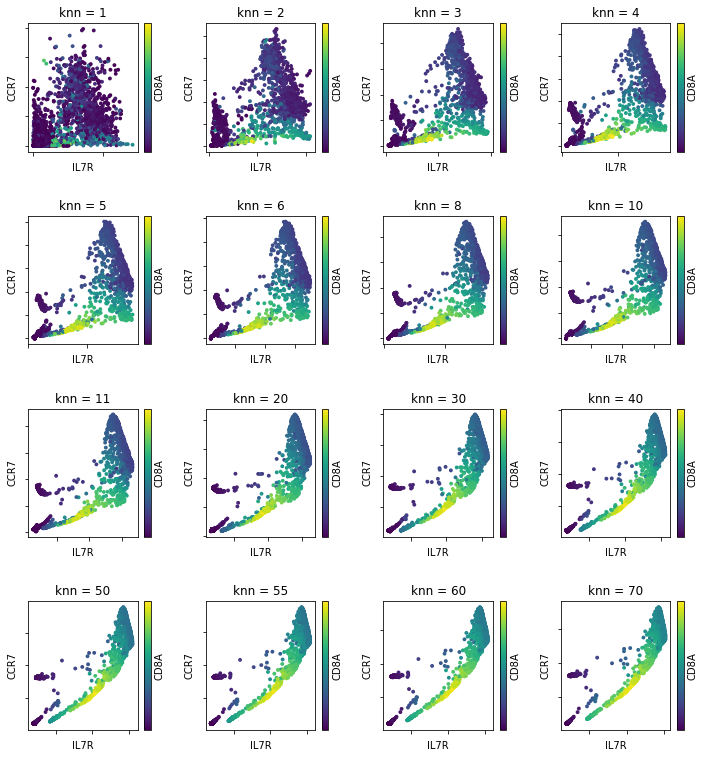

# MAGIC EVALUATION pca (princpal components dimensions)


Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.93 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.01 seconds.
    Calculating affinities...
    Calculated affinities in 0.04 seconds.
  Calculated graph and diffusion operator in 1.08 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.85 seconds.
Calculated MAGIC in 5.54 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.89 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.02 seconds.
    Calculating affinities...
    Calculated affinities in 0.04 seconds.
  Calculated graph and diffusion operator in 1.04 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.48 seconds.
Calculated MAGIC in 4.71 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.81 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.02 seconds.
    Calculating affinities...
    Calculated affinities in 0.09 seconds.
  Calculated graph and diffusion operator in 1.04 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.31 seconds.
Calculated MAGIC in 4.55 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.86 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.03 seconds.
    Calculating affinities...
    Calculated affinities in 0.04 seconds.
  Calculated graph and diffusion operator in 1.01 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.41 seconds.
Calculated MAGIC in 4.61 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.89 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.04 seconds.
    Calculating affinities...
    Calculated affinities in 0.06 seconds.
  Calculated graph and diffusion operator in 1.06 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.50 seconds.
Calculated MAGIC in 4.74 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.94 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.04 seconds.
    Calculating affinities...
    Calculated affinities in 0.06 seconds.
  Calculated graph and diffusion operator in 1.11 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.61 seconds.
Calculated MAGIC in 4.91 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.10 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.07 seconds.
    Calculating affinities...
    Calculated affinities in 0.09 seconds.
  Calculated graph and diffusion operator in 1.33 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.60 seconds.
Calculated MAGIC in 5.12 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.17 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.15 seconds.
    Calculating affinities...
    Calculated affinities in 0.12 seconds.
  Calculated graph and diffusion operator in 1.52 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.61 seconds.
Calculated MAGIC in 5.31 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.42 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.15 seconds.
    Calculating affinities...
    Calculated affinities in 0.16 seconds.
  Calculated graph and diffusion operator in 1.80 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.88 seconds.
Calculated MAGIC in 5.86 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.61 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.21 seconds.
    Calculating affinities...
    Calculated affinities in 0.23 seconds.
  Calculated graph and diffusion operator in 2.13 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.86 seconds.
Calculated MAGIC in 6.21 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.91 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.29 seconds.
    Calculating affinities...
    Calculated affinities in 0.25 seconds.
  Calculated graph and diffusion operator in 2.54 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.15 seconds.
Calculated MAGIC in 6.85 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.10 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.37 seconds.
    Calculating affinities...
    Calculated affinities in 0.43 seconds.
  Calculated graph and diffusion operator in 2.98 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.12 seconds.
Calculated MAGIC in 8.34 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.65 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.42 seconds.
    Calculating affinities...
    Calculated affinities in 0.40 seconds.
  Calculated graph and diffusion operator in 3.55 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.22 seconds.
Calculated MAGIC in 8.18 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.91 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.47 seconds.
    Calculating affinities...
    Calculated affinities in 0.48 seconds.
  Calculated graph and diffusion operator in 3.93 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.27 seconds.
Calculated MAGIC in 8.41 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.86 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.52 seconds.
    Calculating affinities...
    Calculated affinities in 0.50 seconds.
  Calculated graph and diffusion operator in 3.95 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.04 seconds.
Calculated MAGIC in 8.18 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 3.09 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.61 seconds.
    Calculating affinities...
    Calculated affinities in 0.59 seconds.
  Calculated graph and diffusion operator in 4.36 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.87 seconds.
Calculated MAGIC in 8.41 seconds.


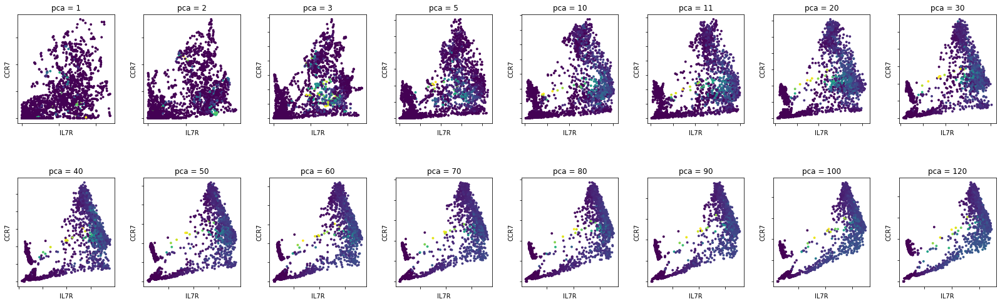

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn




f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()


import magic

pca_vec = (1,2,3,5,10,11,20,30,40,50,60,70,80,90,100,120)

for i in range(len(knn_vec)):
    pca_curr = pca_vec[i]


    magic_operator = magic.MAGIC(t = 5 , n_pca = pca_curr, knn = 5,decay= 5, random_state=1)
    imputated_magic =magic_operator.fit_transform(pcbm10x)


    x = imputated_magic["IL7R"]
    y = imputated_magic["CCR7"]
    c = imputated_magic["FOXP3"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.plasma)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('pca = ' + str(pca_curr))
    #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()

# MAGIC EVALUATION pca (princpal components dimensions)


Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.89 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.01 seconds.
    Calculating affinities...
    Calculated affinities in 0.02 seconds.
  Calculated graph and diffusion operator in 1.02 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.51 seconds.
Calculated MAGIC in 4.96 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.88 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.02 seconds.
    Calculating affinities...
    Calculated affinities in 0.02 seconds.
  Calculated graph and diffusion operator in 0.99 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.58 seconds.
Calculated MAGIC in 4.77 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.83 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.02 seconds.
    Calculating affinities...
    Calculated affinities in 0.04 seconds.
  Calculated graph and diffusion operator in 0.97 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.49 seconds.
Calculated MAGIC in 4.64 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.76 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.03 seconds.
    Calculating affinities...
    Calculated affinities in 0.04 seconds.
  Calculated graph and diffusion operator in 0.90 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.51 seconds.
Calculated MAGIC in 4.59 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.78 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.04 seconds.
    Calculating affinities...
    Calculated affinities in 0.05 seconds.
  Calculated graph and diffusion operator in 0.95 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.65 seconds.
Calculated MAGIC in 4.78 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.01 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.04 seconds.
    Calculating affinities...
    Calculated affinities in 0.06 seconds.
  Calculated graph and diffusion operator in 1.19 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.69 seconds.
Calculated MAGIC in 5.07 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.07 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.07 seconds.
    Calculating affinities...
    Calculated affinities in 0.08 seconds.
  Calculated graph and diffusion operator in 1.29 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.70 seconds.
Calculated MAGIC in 5.18 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.19 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 1.52 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.91 seconds.
Calculated MAGIC in 5.61 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.83 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.17 seconds.
    Calculating affinities...
    Calculated affinities in 0.19 seconds.
  Calculated graph and diffusion operator in 2.28 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.13 seconds.
Calculated MAGIC in 6.63 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.73 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.22 seconds.
    Calculating affinities...
    Calculated affinities in 0.22 seconds.
  Calculated graph and diffusion operator in 2.24 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.95 seconds.
Calculated MAGIC in 6.42 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.09 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.27 seconds.
    Calculating affinities...
    Calculated affinities in 0.27 seconds.
  Calculated graph and diffusion operator in 2.72 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.96 seconds.
Calculated MAGIC in 6.87 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.91 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.38 seconds.
    Calculating affinities...
    Calculated affinities in 0.36 seconds.
  Calculated graph and diffusion operator in 2.72 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.16 seconds.
Calculated MAGIC in 7.06 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.09 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.41 seconds.
    Calculating affinities...
    Calculated affinities in 0.39 seconds.
  Calculated graph and diffusion operator in 2.98 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.91 seconds.
Calculated MAGIC in 7.07 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.32 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.49 seconds.
    Calculating affinities...
    Calculated affinities in 0.45 seconds.
  Calculated graph and diffusion operator in 3.33 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.87 seconds.
Calculated MAGIC in 7.38 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.47 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.53 seconds.
    Calculating affinities...
    Calculated affinities in 0.58 seconds.
  Calculated graph and diffusion operator in 3.67 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.28 seconds.
Calculated MAGIC in 8.15 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 3.14 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.62 seconds.
    Calculating affinities...
    Calculated affinities in 0.59 seconds.
  Calculated graph and diffusion operator in 4.45 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.06 seconds.
Calculated MAGIC in 8.80 seconds.


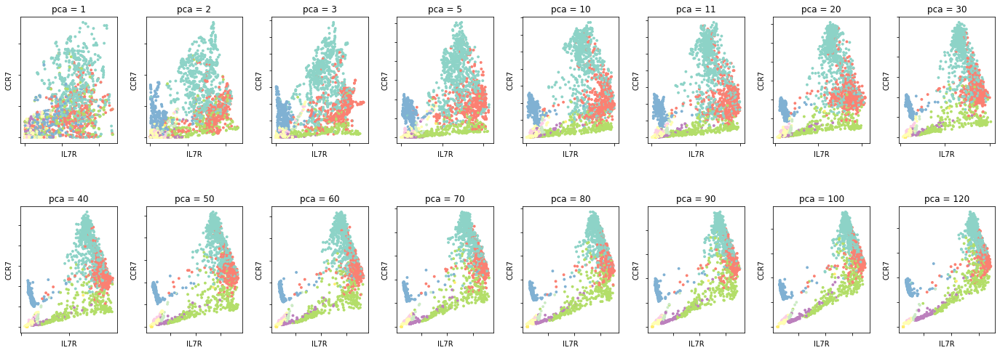

In [ ]:
import matplotlib

import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn
a = clusters['clus'].to_numpy()
a.shape

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

pca_vec = (1,2,3,5,10,11,20,30,40,50,60,70,80,90,100,120)

for i in range(len(knn_vec)):
    pca_curr = pca_vec[i]


    magic_operator = magic.MAGIC(t = 5 , n_pca = pca_curr, knn = 5,decay= 5, random_state=1)
    imputated_magic =magic_operator.fit_transform(pcbm10x)


    x = imputated_magic["IL7R"]
    y = imputated_magic["CCR7"]
    c = imputated_magic["CD8A"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=a, cmap=cm.Set3)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('pca = ' + str(pca_curr))
    #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()

# MAGIC EVALUATION pca (princpal components dimensions)knn= 10


Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.05 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.01 seconds.
    Calculating affinities...
    Calculated affinities in 0.02 seconds.
  Calculated graph and diffusion operator in 1.20 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.55 seconds.
Calculated MAGIC in 5.19 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.86 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.02 seconds.
    Calculating affinities...
    Calculated affinities in 0.03 seconds.
  Calculated graph and diffusion operator in 0.99 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.74 seconds.
Calculated MAGIC in 4.89 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 0.78 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.03 seconds.
    Calculating affinities...
    Calculated affinities in 0.04 seconds.
  Calculated graph and diffusion operator in 0.93 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.78 seconds.
Calculated MAGIC in 4.89 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.36 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.04 seconds.
    Calculating affinities...
    Calculated affinities in 0.10 seconds.
  Calculated graph and diffusion operator in 1.60 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.87 seconds.
Calculated MAGIC in 5.80 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.02 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.05 seconds.
    Calculating affinities...
    Calculated affinities in 0.08 seconds.
  Calculated graph and diffusion operator in 1.22 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.68 seconds.
Calculated MAGIC in 5.07 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.14 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.07 seconds.
    Calculating affinities...
    Calculated affinities in 0.07 seconds.
  Calculated graph and diffusion operator in 1.36 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.82 seconds.
Calculated MAGIC in 5.38 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.01 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.08 seconds.
    Calculating affinities...
    Calculated affinities in 0.10 seconds.
  Calculated graph and diffusion operator in 1.27 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.24 seconds.
Calculated MAGIC in 5.69 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.42 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.15 seconds.
  Calculated graph and diffusion operator in 1.78 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.83 seconds.
Calculated MAGIC in 6.80 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.78 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.20 seconds.
    Calculating affinities...
    Calculated affinities in 0.33 seconds.
  Calculated graph and diffusion operator in 2.39 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 5.02 seconds.
Calculated MAGIC in 7.72 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 1.70 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.24 seconds.
    Calculating affinities...
    Calculated affinities in 0.25 seconds.
  Calculated graph and diffusion operator in 2.28 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.83 seconds.
Calculated MAGIC in 7.44 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.19 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.28 seconds.
    Calculating affinities...
    Calculated affinities in 0.29 seconds.
  Calculated graph and diffusion operator in 2.85 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.22 seconds.
Calculated MAGIC in 7.28 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.03 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.39 seconds.
    Calculating affinities...
    Calculated affinities in 0.39 seconds.
  Calculated graph and diffusion operator in 2.88 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.23 seconds.
Calculated MAGIC in 7.28 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.14 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.43 seconds.
    Calculating affinities...
    Calculated affinities in 0.42 seconds.
  Calculated graph and diffusion operator in 3.06 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.93 seconds.
Calculated MAGIC in 8.19 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 2.77 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.50 seconds.
    Calculating affinities...
    Calculated affinities in 0.49 seconds.
  Calculated graph and diffusion operator in 3.86 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.88 seconds.
Calculated MAGIC in 9.11 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 3.01 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.53 seconds.
    Calculating affinities...
    Calculated affinities in 0.54 seconds.
  Calculated graph and diffusion operator in 4.18 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.72 seconds.
Calculated MAGIC in 9.25 seconds.
Calculating MAGIC...
  Running MAGIC on 2638 cells and 13714 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/cristian/.local/lib/python3.8/site-packages/magic/magic.py:474: UserWarning:

Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.



    Calculated PCA in 3.46 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.65 seconds.
    Calculating affinities...
    Calculated affinities in 0.71 seconds.
  Calculated graph and diffusion operator in 4.91 seconds.
  Running MAGIC with `solver='exact'` on 13714-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 4.72 seconds.
Calculated MAGIC in 9.95 seconds.


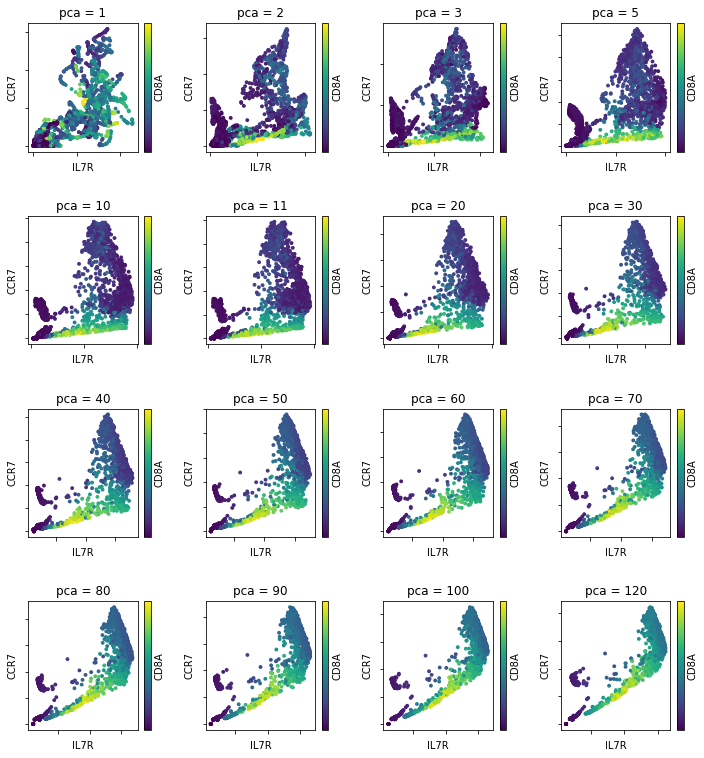

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn




f, axes = plt.subplots(4,4)
f.set_size_inches(12,13)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

pca_vec = (1,2,3,5,10,11,20,30,40,50,60,70,80,90,100,120)

for i in range(len(knn_vec)):
    pca_curr = pca_vec[i]


    magic_operator = magic.MAGIC(t = 5 , n_pca = pca_curr, knn = 10,decay= 5, random_state=1)
    imputated_magic =magic_operator.fit_transform(pcbm10x)


    x = imputated_magic["IL7R"]
    y = imputated_magic["CCR7"]
    c = imputated_magic["CD8A"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.viridis)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('pca = ' + str(pca_curr))
    cbar = f.colorbar(im, ax=axs[i])
    cbar.set_ticks([])
    cbar.set_label('CD8A')

plt.show()

# sc-phenix only UMAP

# 1) # PHENIX EVALUATION **knn**
# (cell information shaering) with t = 5

UMAP(a=None, angular_rp_forest=True, b=None, dens_frac=0.0, dens_lambda=0.0,
     dens_var_shift=0.1, densmap=False, disconnection_distance=None,
     force_approximation_algorithm=False, init='spectral', learning_rate=1.0,
     local_connectivity=1.0, low_memory=True, metric='cosine', metric_kwds=None,
     min_dist=0.3, n_components=40, n_epochs=2000, n_jobs=-1, n_neighbors=10,
     negative_sample_rate=1, output_dens=False, output_metric='euclidean',
     output_metric_kwds=None, random_state=1, repulsion_strength=1.0,
     set_op_mix_ratio=1.0, spread=1.0, target_metric='categorical',
     target_metric_kwds=None, ...)
Construct fuzzy simplicial set
Sun Sep 26 15:35:23 2021 Finding Nearest Neighbors
Sun Sep 26 15:35:23 2021 Finished Nearest Neighbor Search
Sun Sep 26 15:35:23 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 

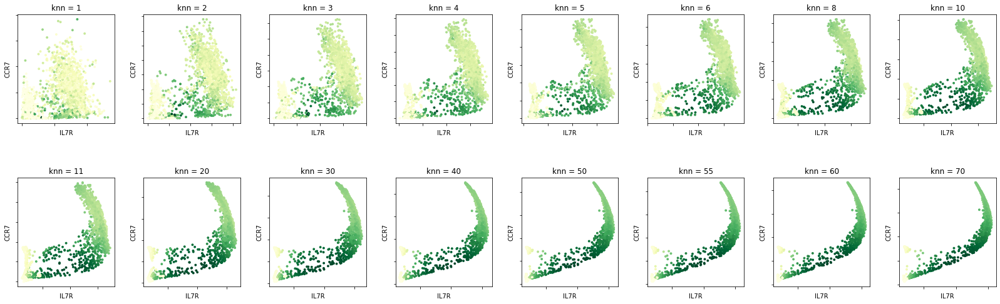

In [ ]:
# 1) # PHENIX EVALUATION **knn**
# (cell information shaering) with t = 5

# phenix  EVALUATION KNN

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

knn_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(knn_vec)):
    knn_curr = knn_vec[i]


    #pca_data= run_pca(pcbm10x,n_components=30, random_state=1)

    umap_data= run_umap(pcbm10x,n_components=40,n_neighbors=10,verbose= True,metric='cosine',min_dist=0.3,n_epochs=2000,random_state=1,negative_sample_rate=1)

    IMPUTATED_DATA_sc_PHENIX = sc_PHENIX(pcbm10x ,umap_data,t=5,knn=knn_curr,decay=5)
    df_new_curr = IMPUTATED_DATA_sc_PHENIX


    x = IMPUTATED_DATA_sc_PHENIX["IL7R"]
    y = IMPUTATED_DATA_sc_PHENIX["CCR7"]
    c = IMPUTATED_DATA_sc_PHENIX["CD8A"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('knn = ' + str(knn_curr))
    #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()

import magic

knn_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(knn_vec)):
    knn_curr = knn_vec[i]


    #pca_data= run_pca(pcbm10x,n_components=30, random_state=1)

    umap_data= run_umap(pcbm10x,n_components=40,n_neighbors=10,verbose= True,metric='cosine',min_dist=0.3,n_epochs=2000,random_state=1,negative_sample_rate=1)

    IMPUTATED_DATA_sc_PHENIX = sc_PHENIX(pcbm10x ,umap_data,t=5,knn=knn_curr,decay=5)
    df_new_curr = IMPUTATED_DATA_sc_PHENIX


    x = IMPUTATED_DATA_sc_PHENIX["IL7R"]
    y = IMPUTATED_DATA_sc_PHENIX["CCR7"]
    c = IMPUTATED_DATA_sc_PHENIX["FOXP3"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=c, cmap=cm.YlGn)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('knn = ' + str(knn_curr))
    #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()

In [ ]:
# phenix  EVALUATION KNN
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()
a = clusters['clus'].to_numpy()
import magic

knn_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(knn_vec)):
    knn_curr = knn_vec[i]


    #pca_data= run_pca(pcbm10x,n_components=30, random_state=1)

    umap_data= run_umap(pcbm10x,n_components=40,n_neighbors=10,verbose= True,metric='cosine',min_dist=0.3,n_epochs=2000,random_state=1,negative_sample_rate=1)

    IMPUTATED_DATA_sc_PHENIX = sc_PHENIX(pcbm10x ,umap_data,t=5,knn=knn_curr,decay=5)
    df_new_curr = IMPUTATED_DATA_sc_PHENIX


    x = IMPUTATED_DATA_sc_PHENIX["IL7R"]
    y = IMPUTATED_DATA_sc_PHENIX["CCR7"]
    c = IMPUTATED_DATA_sc_PHENIX["FOXP3"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=a, cmap=cm.Set3)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('knn = ' + str(knn_curr))
    #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()

UMAP(a=None, angular_rp_forest=True, b=None, dens_frac=0.0, dens_lambda=0.0,
     dens_var_shift=0.1, densmap=False, disconnection_distance=None,
     force_approximation_algorithm=False, init='spectral', learning_rate=1.0,
     local_connectivity=1.0, low_memory=True, metric='cosine', metric_kwds=None,
     min_dist=0.3, n_components=40, n_epochs=2000, n_jobs=-1, n_neighbors=10,
     negative_sample_rate=1, output_dens=False, output_metric='euclidean',
     output_metric_kwds=None, random_state=1, repulsion_strength=1.0,
     set_op_mix_ratio=1.0, spread=1.0, target_metric='categorical',
     target_metric_kwds=None, ...)
Construct fuzzy simplicial set


/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


Mon Sep 27 02:24:37 2021 Finding Nearest Neighbors
Mon Sep 27 02:24:40 2021 Finished Nearest Neighbor Search
Mon Sep 27 02:24:43 2021 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epochs
Mon Sep 27 02:25:03 2021 Finished embedding
calculando distancias
(2638, 2638)
done distance matrix
knn
 knn done
 afinity matrix
 afinity matrix done
imputation
done
done Mon Sep 27 02:25:12 2021
UMAP(a=None, angular_rp_forest=True, b=None, dens_frac=0.0, dens_lambda=0.0,
     dens_var_shift=0.1, densmap=False, disconnection_distance=None,
     force_approximation_algorithm=False, init='spectral', learning_rate=1.0,
     local_connectivity=1.0, low_memory=True, metric='cosine', metric_kwds=None,
     min_dist=0.3, n_

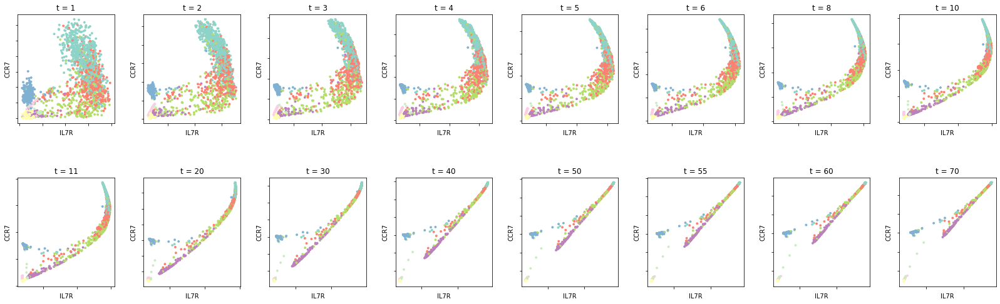

In [ ]:
# phenix  EVALUATION KNN
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from mpl_toolkits.mplot3d import Axes3D
import seaborn

f, axes = plt.subplots(2,8)
f.set_size_inches(14*2,8)
f.subplots_adjust(hspace = .5, wspace=.3)
plt.setp(axes, xticklabels=[], yticklabels=[])
axs = axes.ravel()
a = clusters['clus'].to_numpy()
import magic


t_vec = (1,2,3,4,5,6,8,10,11,20,30,40,50,55,60,70)

for i in range(len(t_vec)):
    t_curr = t_vec[i]



    #pca_data= run_pca(pcbm10x,n_components=30, random_state=1)

    umap_data= run_umap(pcbm10x,n_components=40,n_neighbors=10,verbose= True,metric='cosine',min_dist=0.3,n_epochs=2000,random_state=1,negative_sample_rate=1)

    IMPUTATED_DATA_sc_PHENIX = sc_PHENIX(pcbm10x ,umap_data,t=t_curr,knn=35,decay=5)
    df_new_curr = IMPUTATED_DATA_sc_PHENIX


    x = IMPUTATED_DATA_sc_PHENIX["IL7R"]
    y = IMPUTATED_DATA_sc_PHENIX["CCR7"]
    c = IMPUTATED_DATA_sc_PHENIX["FOXP3"]
    im = axs[i].scatter(x, y, s=15, linewidths=0, c=a, cmap=cm.Set3)
    axs[i].set_xlabel("IL7R")
    axs[i].set_ylabel("CCR7")
    axs[i].set_title('t = ' + str(t_curr))
    #cbar = f.colorbar(im, ax=axs[i])
    #cbar.set_ticks([])
    #cbar.set_label('CD8A')

plt.show()
